# LAB 4, PARTS I AND II
- Diego Hernández Suárez
- Francisco José Landa Ortega
- Eduardo González Agüero

# Lab 5: Understanding Variational Autoencoders (VAE)



------------------------------------------------------
*Pablo M. Olmos pamartin@ing.uc3m.es*

------------------------------------------------------

In this notebook, you will complete the code to train a VAE for a dataset of images of celebrities: [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html). We will use a reduced set of 11.000 images to speed things up.


### Probabilistic model

The probabilistic model to fit to the data is exactly the same one seen in class. If $\mathbf{x}^{(i)}$ are the training images and $\mathbf{z}^{(i)}$ are the corresponding latent (unobserved) embeddings of dimension $k$, $i=1,\ldots,11.000$. Then ...

\begin{align}
p(\mathbf{z}) &= \mathcal{N}(\mathbf{0},\mathbf{I})\\
p(\mathbf{x}|\mathbf{z}) &= \mathcal{N}(\mu_\theta(\mathbf{z}),\sigma_x\mathbf{I})
\end{align}
where $\mu_\theta(\mathbf{z})$ is a Neural Network with input $\mathbf{z}$ and $\sigma_x$ is a reconstruction noise power that we won't train. By default, we will take the value $\sigma_x=0.1$.

### Inference model

We will approximate the posterior distribution $p(\mathbf{z}|\mathbf{x})$ by the following parametric model

$$p(\mathbf{z}|\mathbf{x})\approx q(\mathbf{z}|\mathbf{x}) = \mathcal{N}(\mu_\eta(\mathbf{x}),\text{diag}(\sigma_\eta(\mathbf{x}))$$

where both $\mu_\eta(\mathbf{x}),\text{diag}(\sigma_\eta(\mathbf{x})$ are neural networks with input $\mathbf{x}$.

### Training loss: the evidence lower bound (ELBO)

Since exact inference is intractable in the former model, we will train the parameters of the probabilistic and inference models using the ELBO lower bound

$$\log p(\mathbf{x}) \geq \mathbb{E}_{q(\mathbf{z}|\mathbf{x})}\left[\log p(\mathbf{x}|\mathbf{z})\right] - D_{KL}(q(\mathbf{z}|\mathbf{x}||p(\mathbf{z}))$$

Since $p(\mathbf{z})=\mathcal{N}(\mathbf{0},\mathbf{I})$ and $q(\mathbf{z}|\mathbf{x})$ are both Gaussian then

$$D_{KL}(q(\mathbf{z}|\mathbf{x}||p(\mathbf{z})) = \frac{1}{2}\left(-k+\sum_{j=1}^k \sigma_{\eta,j}-\log(\sigma_{\eta,j})+\mu_{\eta,j}^2\right)$$

During training, the first expectation will be replaced by a one-sample Monte Carlo estimate for every data point. Overall, the ELBO to be optimized using SGD is

$$\text{ELBO}(\theta,\eta,\sigma_x) = \frac{1}{N} \sum_{i=1}^{N} \left(\log p(\mathbf{x}^{(i)}|\tilde{\mathbf{z}}^{(i)}) - D_{KL}(q(\mathbf{z}|\mathbf{x}^{(i)}||p(\mathbf{z}))\right)$$

where $\tilde{\mathbf{z}}^{(i)}$ is a sample from $q(\mathbf{z}|\mathbf{x}^{(i)})$ computed as

$$\tilde{\mathbf{z}}^{(i)} =  \mu_\eta(\mathbf{x}) + \sqrt{\sigma_\eta(\mathbf{x})} \epsilon$$
and $\epsilon$ is a sample from a k-dimensional standard Gaussian distribution. This is the **reparameterization trick**. Note that samples are differentiable w.r.t. the parameters in both $\mu_\eta(\mathbf{x})$ and $\sigma_\eta(\mathbf{x})$.

In [ ]:
import torch
from torch import nn
import numpy as np
import torchvision
from torchvision import datasets
import torchvision.transforms as transforms
from torch import optim
import time

import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

## Part I: Loading the reduced CelebA dataset

First, import to your own Drive the folder I shared with you in Aula Global.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path_to_folder = '/content/drive/My Drive/datasets/Project IV NL/reduced_celebA/' # This is written taking into account the following code

With the following function we import the database using Pytorch dataloaders ...

In [ ]:
def get_celeba(batch_size, dataset_directory):

    train_transformation = transforms.Compose([
        transforms.Resize((64, 64)),        # THE IMAGES ARE RE-SCALED TO 64x64
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])
    train_dataset = torchvision.datasets.ImageFolder(dataset_directory + 'celeba', train_transformation)


    # Use sampler for randomization
    training_sampler = torch.utils.data.SubsetRandomSampler(range(len(train_dataset)))

    # Prepare Data Loaders for training and validation
    trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, sampler=training_sampler)

    return trainloader

In [ ]:
# We load the database in a single trainloader

In [ ]:
trainloader = get_celeba(32,path_to_folder)

In the following code, we read one mini-batch of images and plot some of them.

In [ ]:
def imshow(img):
    img = img / 2 + 0.5     # unnormalize to plot
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

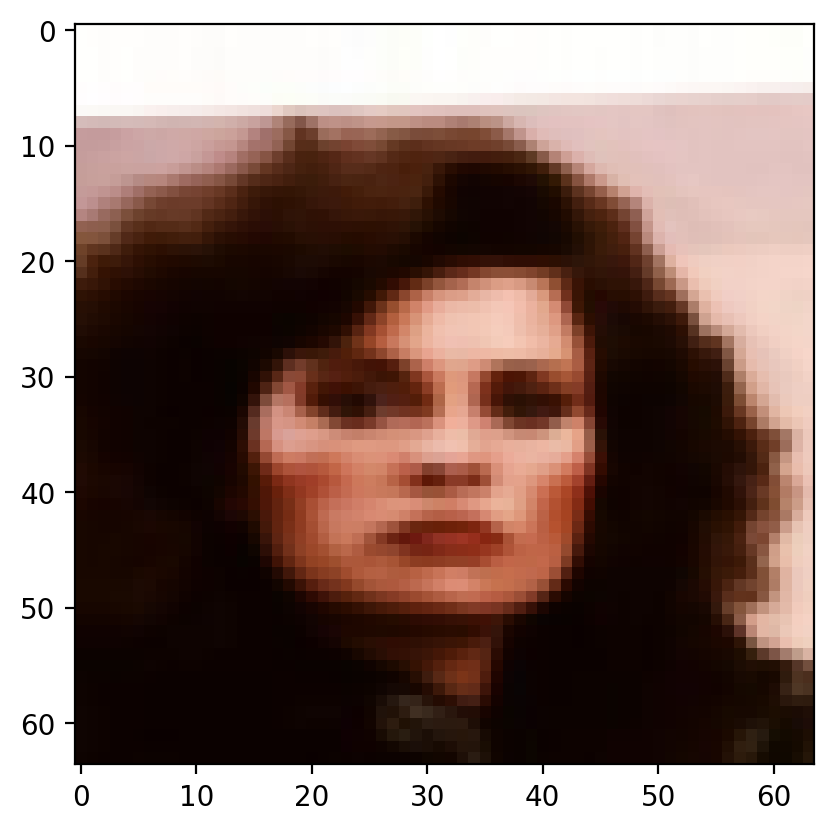

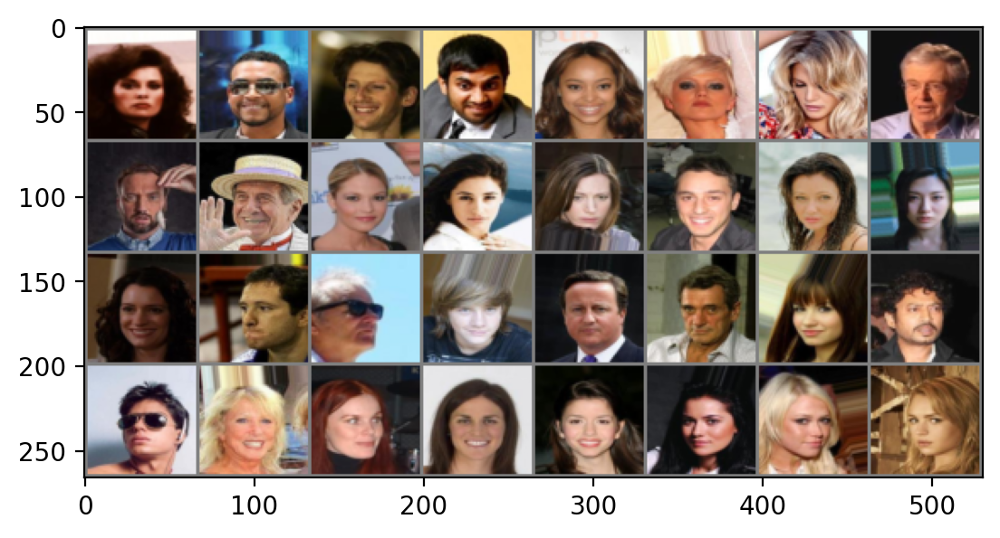

In [ ]:
train = iter(trainloader)

i,l = next(train)

imshow(i[0,:,:,:])

imshow(torchvision.utils.make_grid(i))

## A class to implement the encoder mean and variance

With the following class, we implement the CNN network to obtain both $\mu_\eta(\mathbf{x}), \sigma_\eta(\mathbf{x})$, which determine the moments of the approximate posterior distribution $q(\mathbf{z}|\mathbf{x})$.

We use a single CNN with input $\mathbf{x}$, the output vector of dimension $2k$ is divided in two parts. The first $k$ elements represent the mean, and we compute the variance from the last $k$ elements using a soft-plus.

The actual design of this network is borrowed from [this paper](https://paperswithcode.com/method/beta-vae). It could be improved by adding batch norm layers, but you will see it does perform well already.

> **Exercise**: Complete the following code. What are the spatial dimensions of the 256 feature maps at the ouput of the `conv5` convolutional layer?

In [ ]:
class encoder(nn.Module):

    def __init__(self,dimz,channels=3,var_x=0.1):


        super().__init__()

        self.dimz = dimz    #dimz is k, the dimension of the latent space

        # self.conv1 is a convolutional layer, with 32 output channels, kernel size 4, stride 2,
        # and padding 1

        self.conv1 = nn.Conv2d(in_channels=channels, out_channels=32,
                               kernel_size=4, stride=2, padding=1)

        self.relu = nn.ReLU()

        # self.conv2 is a convolutional layer, with 32 output channels, kernel size 4, stride 2,
        # and padding 1

        self.conv2 = nn.Conv2d(in_channels=32, out_channels=32,
                               kernel_size=4, stride=2, padding=1)

        # self.conv3 is a convolutional layer, with 64 output channels, kernel size 4, stride 2,
        # and padding 1

        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64,
                               kernel_size=4, stride=2, padding=1)

        # self.conv4 is a convolutional layer, with 64 output channels, kernel size 4, stride 2,
        # and padding 1

        self.conv4 = nn.Conv2d(in_channels=64, out_channels=64,
                               kernel_size=4, stride=2, padding=1)

        # self.conv5 is a convolutional layer, with 256 output channels, kernel size 4, stride 1,
        # and padding 0

        self.conv5 = nn.Conv2d(in_channels=64, out_channels=256,
                               kernel_size=4, stride=1, padding=0)


        # self.linear is a linear layer with dimz*2 outputs
        self.linear = nn.Linear(256, dimz*2)

        self.softplus = nn.Softplus()

    def forward(self,x):

        # The forward method to project and image into a 2dimz dimensional vector

        z = self.relu(self.conv1(x))
        z = self.relu(self.conv2(z))
        z = self.relu(self.conv3(z))
        z = self.relu(self.conv4(z))
        z = self.relu(self.conv5(z))
        # Transform z into a 256-dim vector
        z = z.view(z.size(0), 256)
        z = self.linear(z)

        return z

    def encode_and_sample(self,x,flag_sample=True):

        # This methods compute both the posterior mean and variance
        # Also we obtain a sample from the posterior using the
        # reparameterization trick.

        # We obtain the encoder projection using the forward method

        z = self.forward(x)

        # The mean is the first dimz components of the forward output

        mu = z[:, :self.dimz]

        # We compute the variance from the last dimz components using a
        # soft plus
        var = self.softplus(0.5 * z[:, self.dimz:])

        sample = None

        if(flag_sample==True):

            eps = torch.randn_like(var)

            sample = mu + eps*(var**0.5)

        return mu,var,sample


> **Exercise**: Using `dimz=2`, create an encoder object and print the mean `mu_z` and variance `var z` in the z space for one image.

In [ ]:
encoder_obj = encoder(dimz=2)
image = torch.randn(1, 3, 64, 64)  # Assuming RGB image with size 64x64
mu_z, var_z, sample_z = encoder_obj.encode_and_sample(image)
print("Mean in the latent space (mu_z):", mu_z)
print("Variance in the latent space (var_z):", var_z)

Mean in the latent space (mu_z): tensor([[0.0030, 0.0201]], grad_fn=<SliceBackward0>)
Variance in the latent space (var_z): tensor([[0.6808, 0.6742]], grad_fn=<SoftplusBackward0>)


The dimension of mean and variance is 2 because dimz = 2

## A class to implement the decoder mean

Given a sample from $\mathbf{z}$, we generate images by sample from $p(\mathbf{x}|\mathbf{z}) = \mathcal{N}(\mu_\theta(\mathbf{z}),\sigma_x\mathbf{I})$, where we take $\sigma_x=0.1$ as a reconstruction noise. The following class implements the mean NN $\mu_\theta(\mathbf{z})$ using transpose convolutions. Again, the network design comes from the same [this paper](https://paperswithcode.com/method/beta-vae).

> **Exercise**: complete the following code. Why do we use an hiperbolic tangent output activation?


In [ ]:
class decoder(nn.Module):

    def __init__(self,dimz,channels=3,var_x=0.1):

        super().__init__()

        # We expand z into a 256 dimensional vector

        self.linear = nn.Linear(dimz,256)

        self.relu = nn.ReLU()

        self.tanh = nn.Tanh()

        # self.tconv1 is a convolutional layer, with 64 output channels, kernel size 4, stride 1,
        # and padding 0

        self.tconv1 = nn.ConvTranspose2d(256, 64,
                                         kernel_size=4, stride=1,padding=0)

        # self.tconv2 is a convolutional layer, with 64 output channels, kernel size 4, stride 2,
        # and padding 1

        self.tconv2 = nn.ConvTranspose2d(64, 64,
                                         kernel_size=4, stride=2, padding=1)

        # self.tconv3 is a convolutional layer, with 32 output channels, kernel size 4, stride 2,
        # and padding 1

        self.tconv3 = nn.ConvTranspose2d(64, 32,
                                         kernel_size=4, stride=2,padding=1)

        # self.tconv3 is a convolutional layer, with 32 output channels, kernel size 4, stride 2,
        # and padding 1

        self.tconv4 = nn.ConvTranspose2d(32, 32,
                                         kernel_size=4, stride=2, padding=1)

        # self.tconv3 is a convolutional layer, with channels output channels, kernel size 4, stride 2,
        # and padding 1

        self.tconv5 = nn.ConvTranspose2d(32, channels, kernel_size=4, stride=2,padding=1)

    def forward(self,z):

        x = self.relu(self.linear(z).view(-1,256,1,1))
        x = self.relu(self.tconv1(x))
        x = self.relu(self.tconv2(x))
        x = self.relu(self.tconv3(x))
        x = self.relu(self.tconv4(x))
        x = self.relu(self.tconv5(x))
        return x

    def decode(self,z):

        # This function simply calls the forward method

        return self.forward(z)

We use tanh because its output is [-1,1], which coincidanes with the range of values of normalized pixels. It is also a smooth function, which is good.

> **Exercise:** create a decoder object using again `dimz=2`. Given the mean projection of an image `mu_z` that you obtained before, use the decoder to obtain the mean `x_mean` of $p(\mathbf{x}|\mathbf{z})$. Represent one original image versus the reconstruction. Obviously, since you have not trained the model yet, do expect too much.

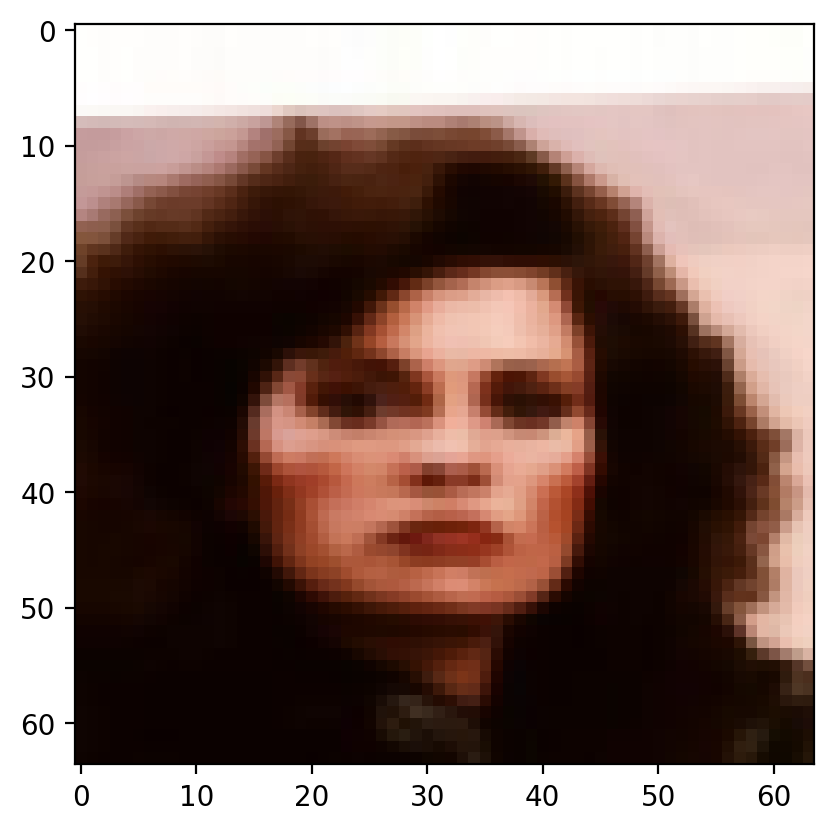

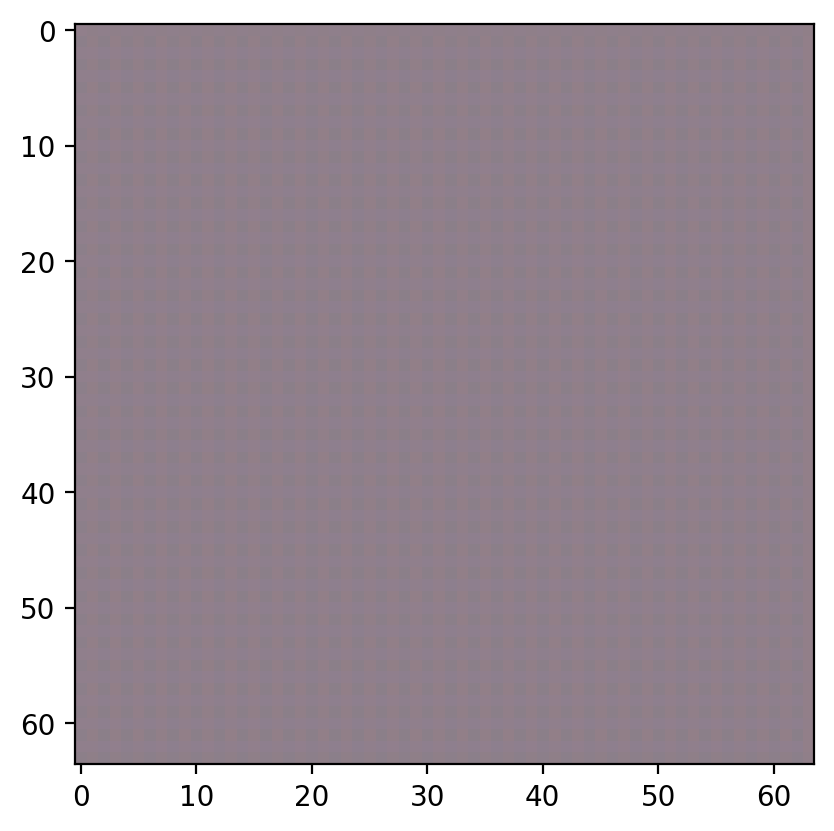

In [ ]:
my_dec = decoder(dimz=2)

x_mean = my_dec.decode(mu_z).detach()

imshow(i[0,:,:,:])

imshow(x_mean[0,:,:,:])

Observe that, since the mean `x_mean` is so different from the real image, then the real image is **extremely unlikely** in the distribution $p(\mathbf{x}|\mathbf{z})$. The model will never generate it by sampling.

For one image `x`, the following function evaluates the log-likelihood of an independent Gaussian distribution given the mean and the diagonal covariance matrix. In the function, both `x` and `mu_x` are passed as images and internally stacked to vectors. `var_x` is a constant. Recall that `var_x` is a constant vector of 0.1 elements.



In [ ]:
def eval_Gaussian_LL(x,mu_x,var_x):

    # x is a mini-batch of images. It has dimension [Batch,3,dimx,dimx]

    # mu_x is a mini-batch of reconstructed images. It has dimension [Batch,3,dimx,dimx]

    # var_x is a torch constant

    D = x.shape[1] * x.shape[2] * x.shape[3]   # Dimension of the image

    x = x.reshape(-1, D)

    mu_x = mu_x.reshape(-1, D)

    var_x = torch.ones_like(mu_x) * var_x

    # Constant term in the gaussian distribution
    cnt = D * np.log(2 * np.pi) + torch.sum(torch.log(var_x), dim=-1)

    # log-likelihood per datapoint

    logp_data = -0.5 * (cnt + torch.sum((x - mu_x) * var_x ** -1 * (x - mu_x), dim=-1))

    # Accumulated Gaussian log-likelihood for all datapoints in the batch
    logp = torch.sum(logp_data)

    return logp,logp_data

> **Exercise:** Compute the log-likelihood of one real image given `x_mean` computed above and `var_x=0.1`.





tensor(-739019.8750)


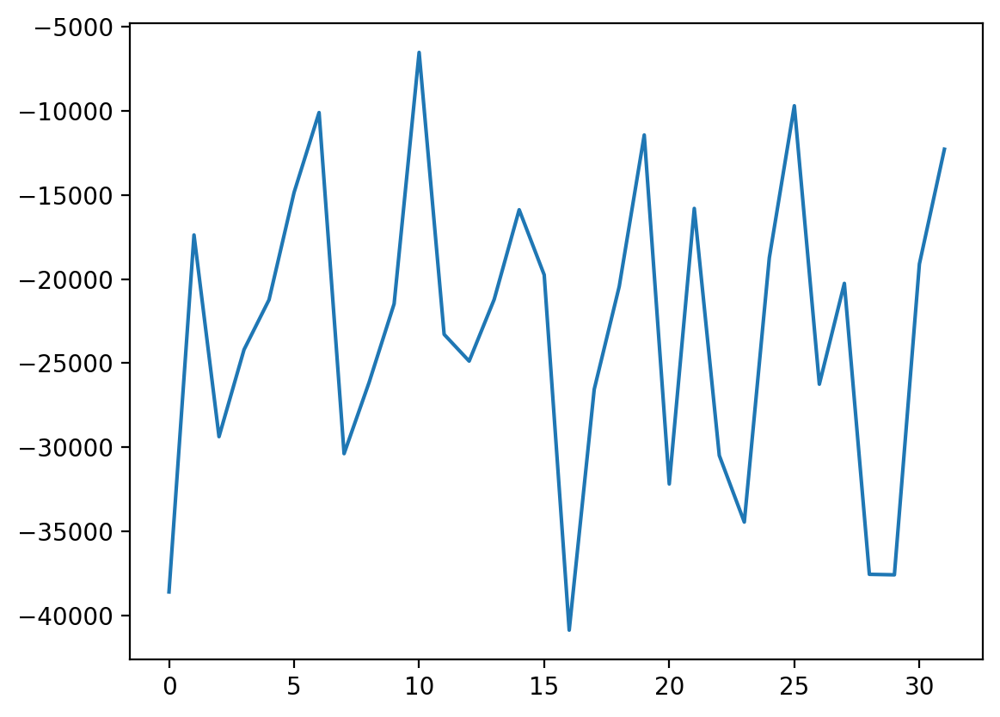

In [ ]:
var_x = 0.1

logp,logp_data = eval_Gaussian_LL(i, x_mean, var_x)

print(logp)

plt.plot(np.arange(0,32),logp_data)

## The variational autoencoder class

The following class puts together the VAE encoder & decoder and also defines the ELBO lower bound. We will extend it later to incorporate training methods.

> **Exercise**: complete the following code.

In [ ]:
class VAE(nn.Module):

    def __init__(self,dimz,channels=3,var_x=0.1):

        super().__init__()

        self.var_x = var_x

        self.dimz = dimz

        # We create an encoder network

        self.encoder = encoder(dimz=dimz, channels=channels, var_x=var_x)

        # We create a decoder network

        self.decoder = decoder(dimz=dimz, channels=channels, var_x=var_x)

    def forward(self,x):

        # In the forward method, we return the mean and variance
        # given by the encoder network and also the reconstruction mean
        # given by the decoder network using a sample from the
        # encoder's posterior distribution.

        mu_z,var_z,sample_z = self.encoder.encode_and_sample(x)

        # Decoder provides the mean of the reconstruction

        mu_x = self.decoder.decode(sample_z)

        return mu_x,mu_z,var_z

    # Reconstruction + KL divergence losses summed over all elements and batch

    def loss_function(self, x, mu_x, mu_z, var_z):

        # We evaluate the loglikelihood in the batch using the function provided above

        logp,_ = eval_Gaussian_LL(x, mu_x, self.var_x)

        # KL divergence between q(z) and N()
        # see Appendix B from VAE paper:
        # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
        # https://arxiv.org/abs/1312.6114

        KLz = -0.5 * torch.sum(1 + torch.log(var_z) - mu_z.pow(2) - var_z)

        # To maximize ELBO we minimize loss (-ELBO)
        return -logp + KLz, -logp, KLz

> **Exercise:** Create a VAE object for `dimz=2` and evaluate the ELBO using `mu_z`, `var_z`, and `x_mean` computed above.

In [ ]:
my_vae = VAE(dimz=2)
elbo, reconstruction_loss, kl_divergence = my_vae.loss_function(i, x_mean, mu_z, var_z)
print("ELBO:", elbo)
print("Reconstruction Loss:", reconstruction_loss)
print("KL Divergence:", kl_divergence)

ELBO: tensor(739019.9375, grad_fn=<AddBackward0>)
Reconstruction Loss: tensor(739019.8750)
KL Divergence: tensor(0.0671, grad_fn=<MulBackward0>)


## Incorporating a training method

The following class completes the implementation of the VAE. **You do not have to edit anything**, but it is highly recommended to go through the code. It is actually very similar to the training classes we have been implementing. Only three points to remark:


- Since training is pretty slow (every epoch can take a few minutes), we save the model every few minibatches. User indicates the saving path using the `save_folder` argument.
- I have introduced a `restore` flag. When set it to true, we load the model parameters from a file saved in the `save_folder` argument.
- The class also incorporates a method to sample from the generative model. Namely, create new images. To this end, we sample $\mathbf{z}$ from $p(\mathbf{z}) = \mathcal{N}(0,I)$ and then we return the mean of $p(\mathbf{x}|\mathbf{z})$.

In [ ]:
class VAE_extended(VAE):

    def __init__(self, dimz=2,  channels=3, var_x=0.1,lr=1e-3,epochs=20,save_folder='./',restore=False):

        super().__init__(dimz,channels=3,var_x=0.1)

        self.lr = lr
        self.optim = optim.Adam(self.parameters(), self.lr)
        self.epochs = epochs

        self.save_folder = save_folder

        if(restore==True):
            state_dict = torch.load(self.save_folder+'VAE_checkpoint.pth')
            self.load_state_dict(state_dict)

        self.loss_during_training = []
        self.reconstruc_during_training = []
        self.KL_during_training = []

        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.to(self.device)

    def trainloop(self,trainloader):

        nims = len(trainloader.dataset)

        self.train()

        for e in range(int(self.epochs)):

            train_loss = 0
            train_rec = 0
            train_kl_l = 0

            idx_batch = 0

            for images, labels in trainloader:

                images = images.to(self.device)

                self.optim.zero_grad()

                mu_x, mu_z, var_z = self.forward(images)

                loss, rec, kl_l = self.loss_function(images,mu_x, mu_z, var_z)

                loss.backward()

                train_loss += loss.item()
                train_rec += rec.item()
                train_kl_l += kl_l.item()

                self.optim.step()

                if(idx_batch%10==0):

                    torch.save(self.state_dict(), self.save_folder + 'VAE_checkpoint.pth')

                idx_batch += 1

            self.loss_during_training.append(train_loss/len(trainloader))
            self.reconstruc_during_training.append(train_rec/len(trainloader))
            self.KL_during_training.append(train_kl_l/len(trainloader))

            if(e%1==0):

                torch.save(self.state_dict(), self.save_folder + 'VAE_checkpoint.pth')
                print('Train Epoch: {} \tLoss: {:.6f}'.format(e,self.loss_during_training[-1]))


    def sample(self,num_imgs):

        with torch.no_grad():

            eps = torch.randn([num_imgs,self.dimz]).to(self.device)

            x_sample = self.decoder.decode(eps)

            return x_sample.to("cpu").detach()

# Validate a pre-trained model

First, we're going to see a VAE model in action. In the file `VAE_checkpoint.pth` linked in Aula Global, I give you the parameters of a VAE with `dim_z=50` trained for 200 epochs with `var_x=0.1`, `lr=1e-3`.

> **Exercise**: Create a VAE with the parameters contained in the file `VAE_checkpoint.pth`. To do so, instantiate the class `VAE_extended` with the `restore_flag` set to `True`.

In [ ]:
path_to_save = '/content/drive/My Drive/datasets/Project IV NL/'
my_vae = VAE_extended(dimz = 50, epochs=200,var_x=0.1, lr=1e-3, save_folder=path_to_save, restore=True)

> **Exercise:** Using the method `sample` from the clase `VAE_extended`, generate 20 images from the probabilistic model. **Note these are images created by our model! They correspond to people that do not exist!**.

There are many variants of VAEs that quite improve these results, but even this vanilla VAE we have implemented does a pretty god job! Despite the images contain lots of artifacts, note that the images contain lots of very realistic details. Also note how the model tries to vary the features of the images (hair, background, smiles etc ...).

In [ ]:
x = my_vae.sample(num_imgs=20)

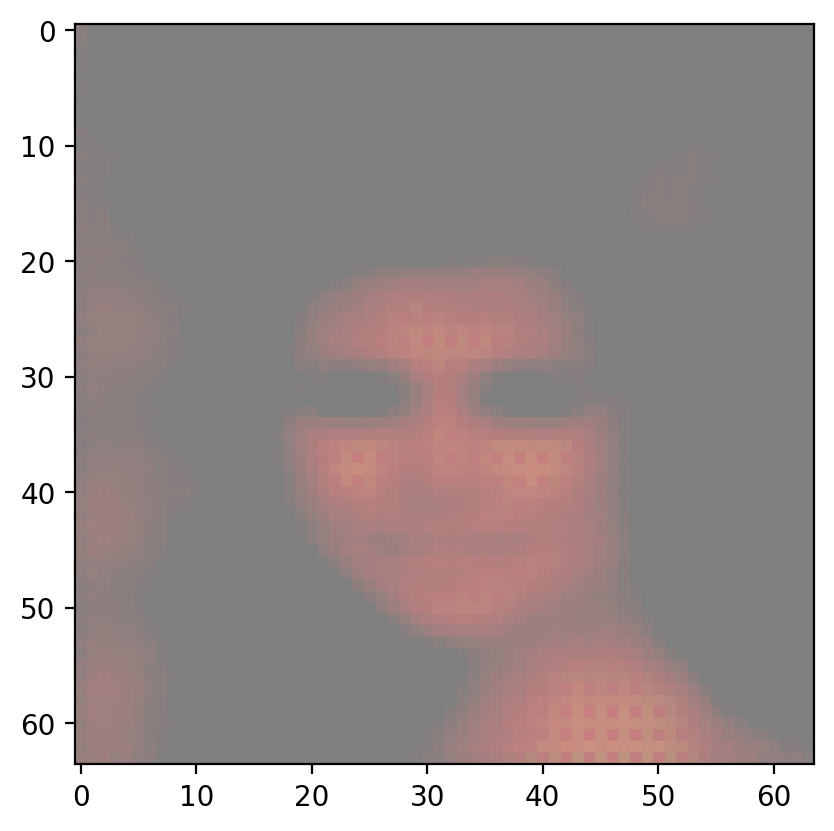

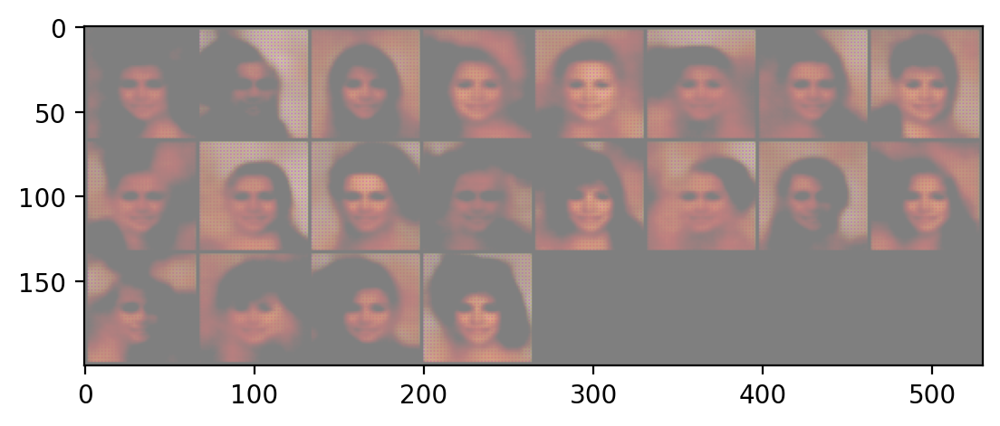

In [ ]:
imshow(x[0,:,:,:])

imshow(torchvision.utils.make_grid(x))

> **Exercise:** Compare a real image versus its reconstruction. Note that the model is by default save in a GPU if available, so you have to move the images there. To visualize reconstructed images, you have to move the result of the decoder back to CPU.

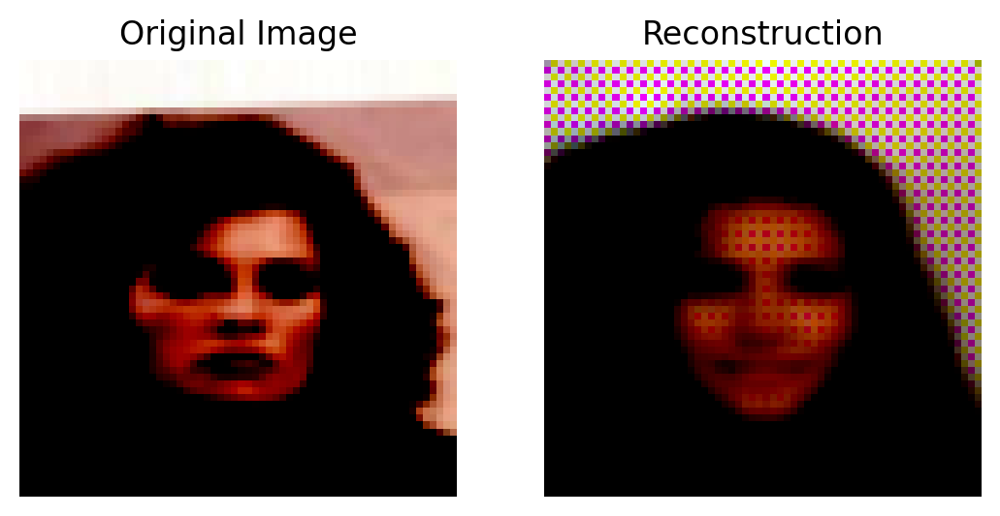

In [ ]:
i_ = i.to(my_vae.device)
z_batch,_,_ = my_vae.encoder.encode_and_sample(i_)

x_reconstructed = my_vae.decoder.decode(z_batch).detach().cpu()

# We plot he original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(i[0,:,:,:].squeeze().permute(1, 2, 0).detach().cpu())
plt.axis('off')

# And the reconstruction
plt.subplot(1, 2, 2)
plt.title('Reconstruction')
plt.imshow(x_reconstructed[0,:,:,:].squeeze().permute(1, 2, 0).numpy())  # Assuming x_reconstructed is a tensor
plt.axis('off')

plt.show()

> Using the VAE, we can also *interpolate* between images. Namely, given the latent representation $\mathbf{z}_1$ and $\mathbf{z}_2$ of two images, we can visualize the images that correspond to different linear interpolations between both latent points. To this end, given $w=[0,0.1,0.2, ...,1]$, will visualize the mean of $p(\mathbf{x}|\mathbf{z})$ for

$$z = (1-w)\mathbf{z}_1+w\mathbf{z}_2$$

**Exercise:** Complete the following code to interpolate between two images

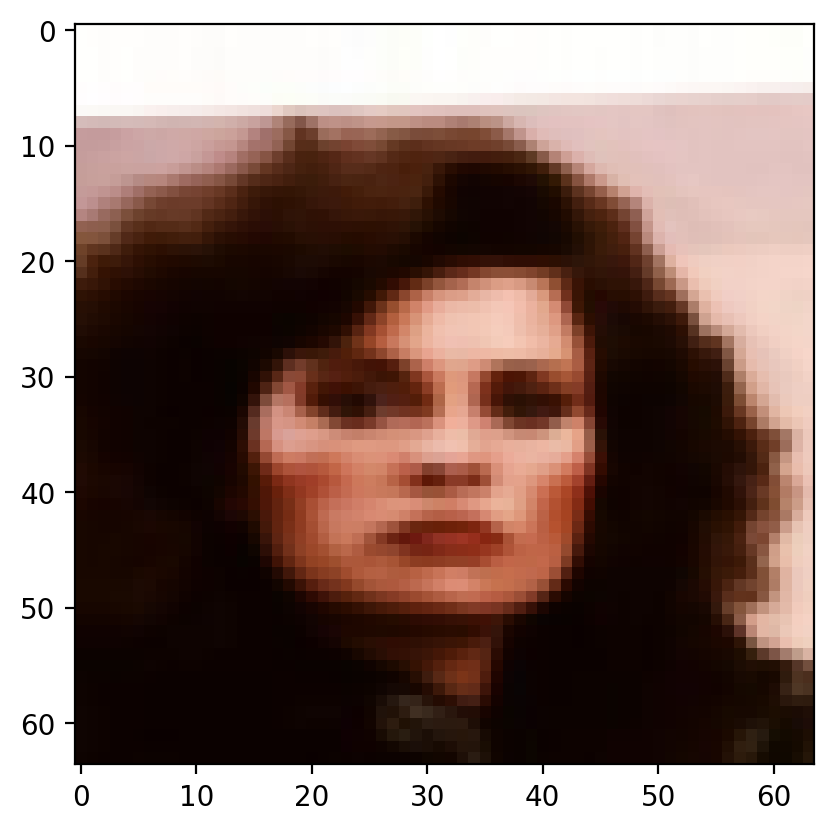

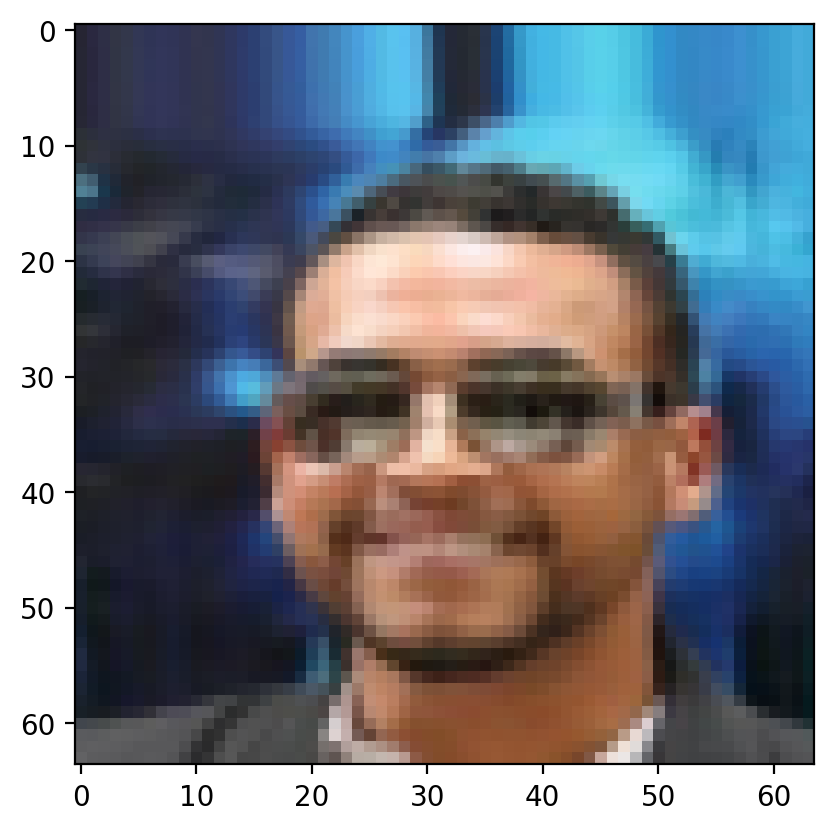

In [ ]:
# Lets visualize the images to interpolate

img_1 = i[0,:,:,:]
img_2 = i[1,:,:,:]

imshow(img_1)

imshow(img_2)


In [ ]:
# z_1 and z_2 are saved in z_batch, computed in the previous exercise

z_1 = z_batch[0]
z_2 = z_batch[1]

# Linear interpolation

weight = torch.Tensor(1.0-np.arange(0,10,1)/10)

reconstructed_image = [my_vae.decoder.decode(z_1*w+z_2*(1-w)).to('cpu').detach() for w in weight]

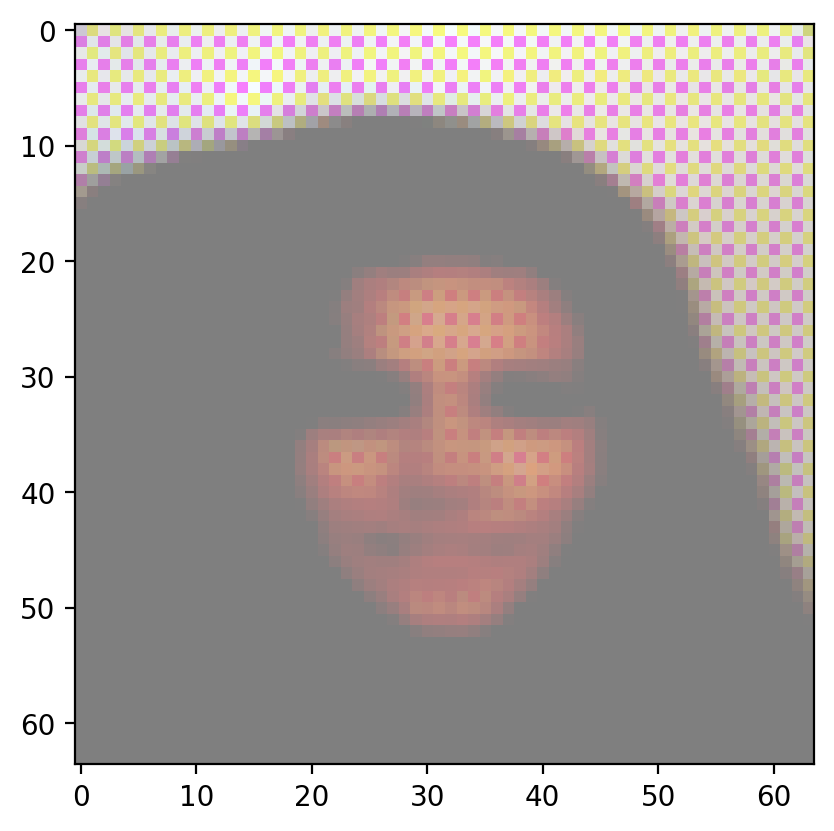

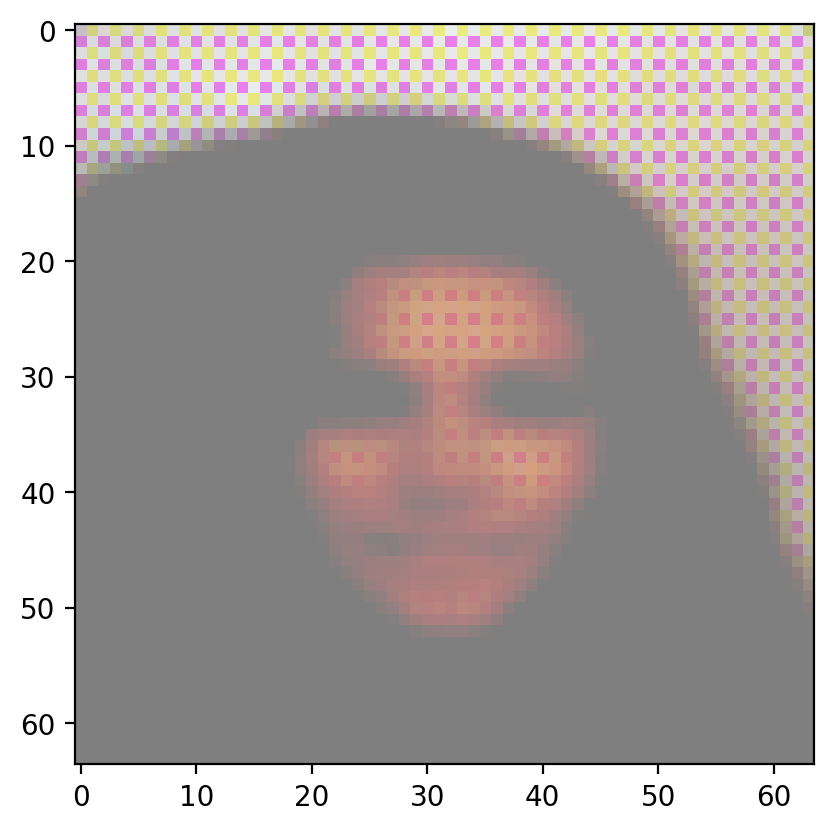

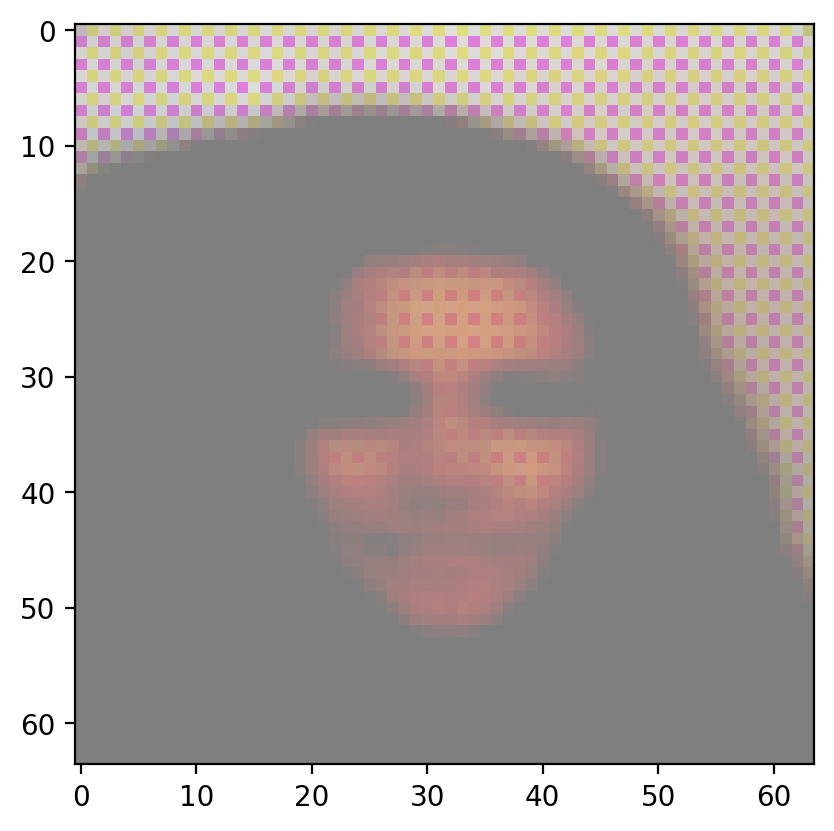

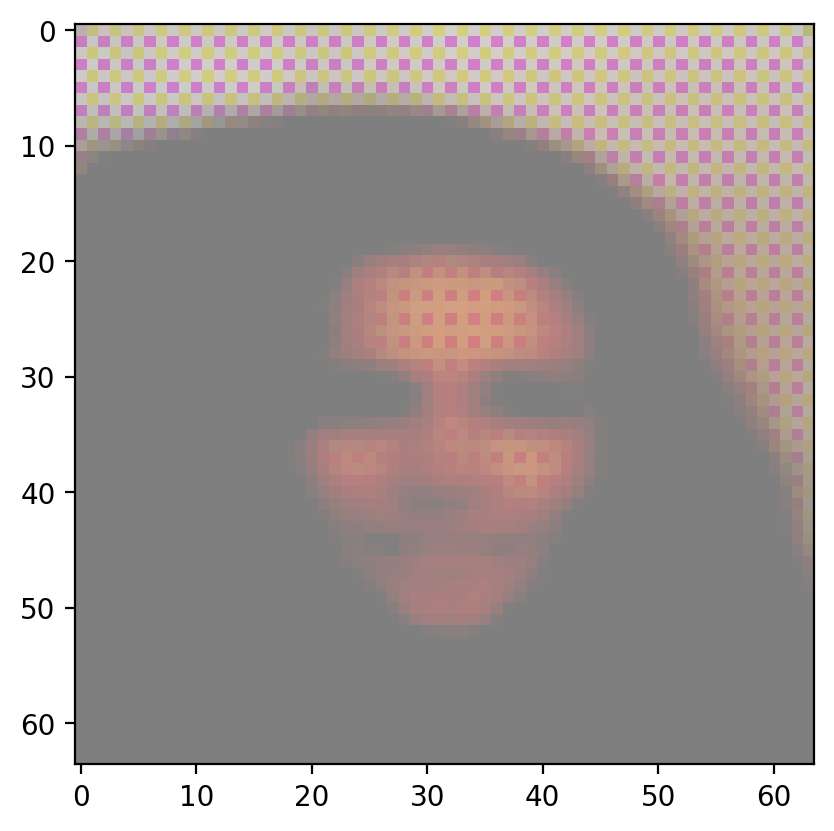

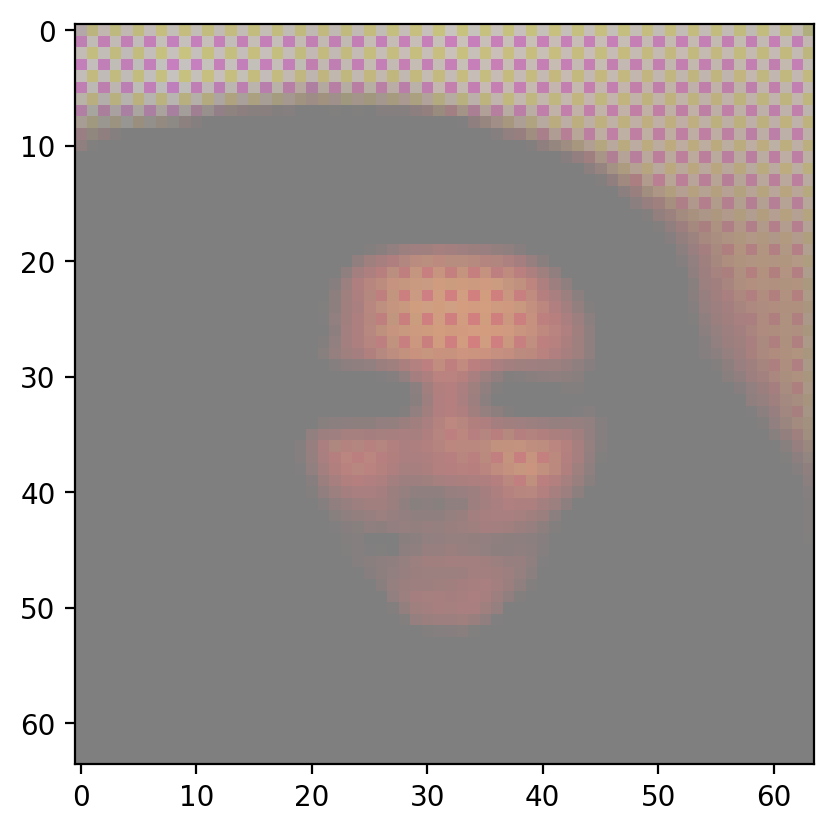

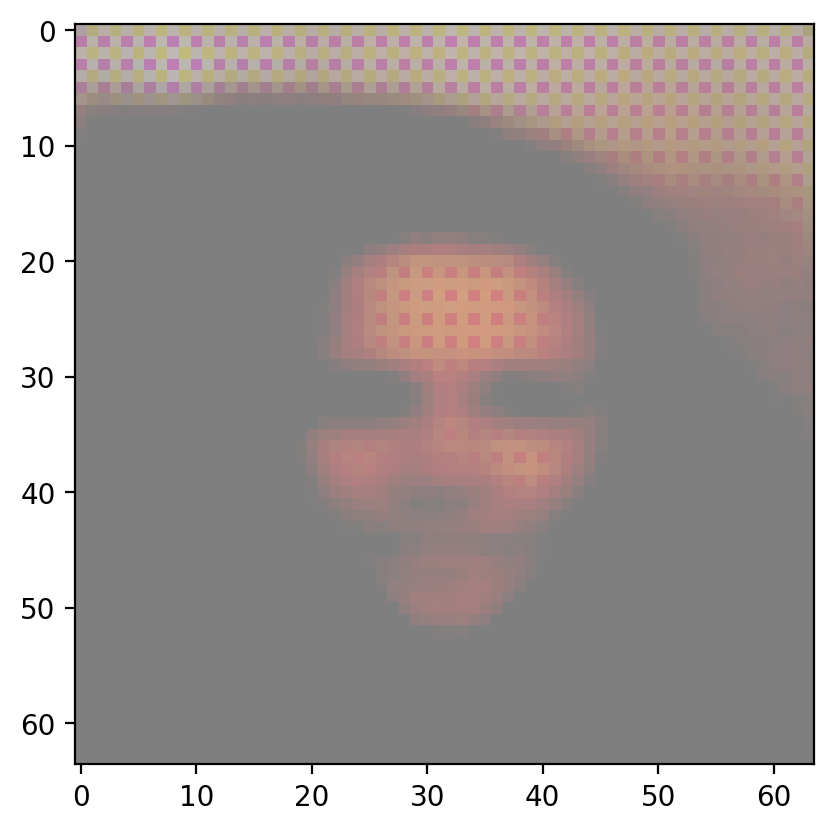

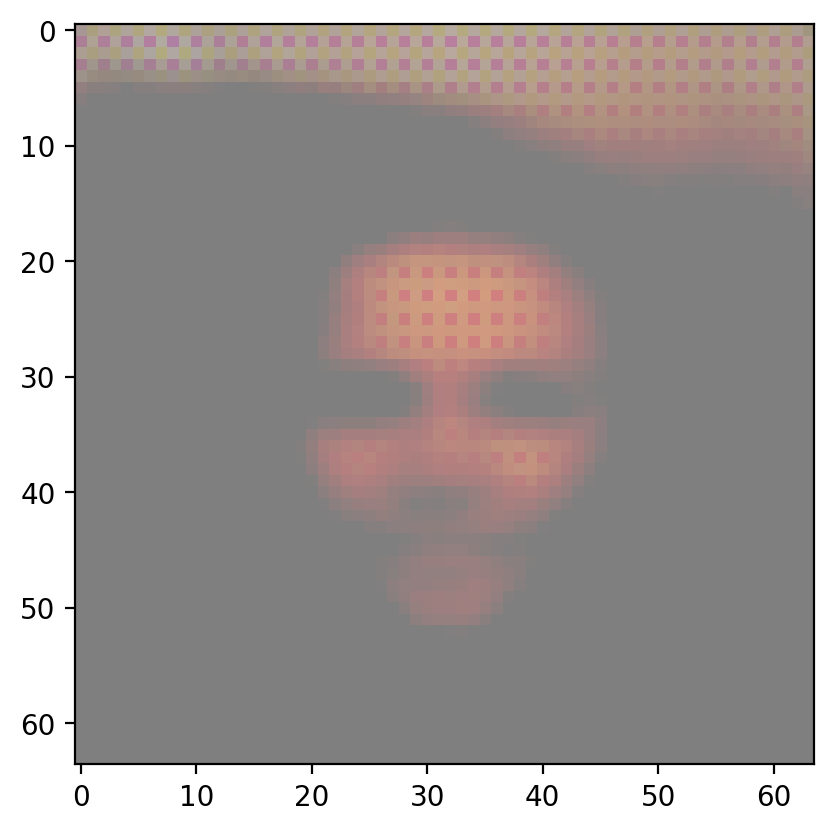

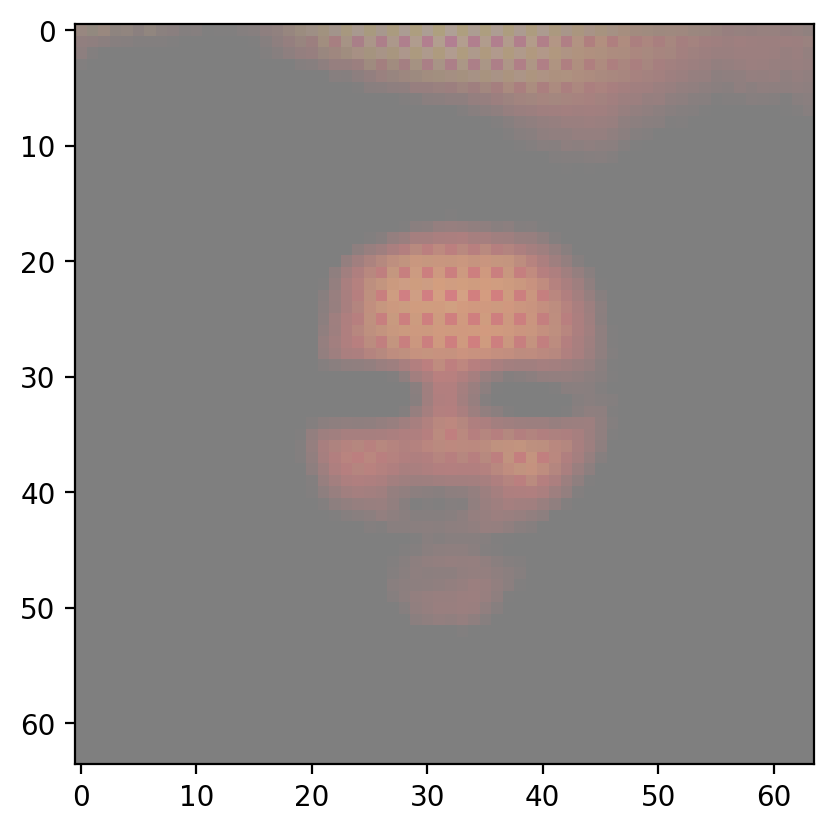

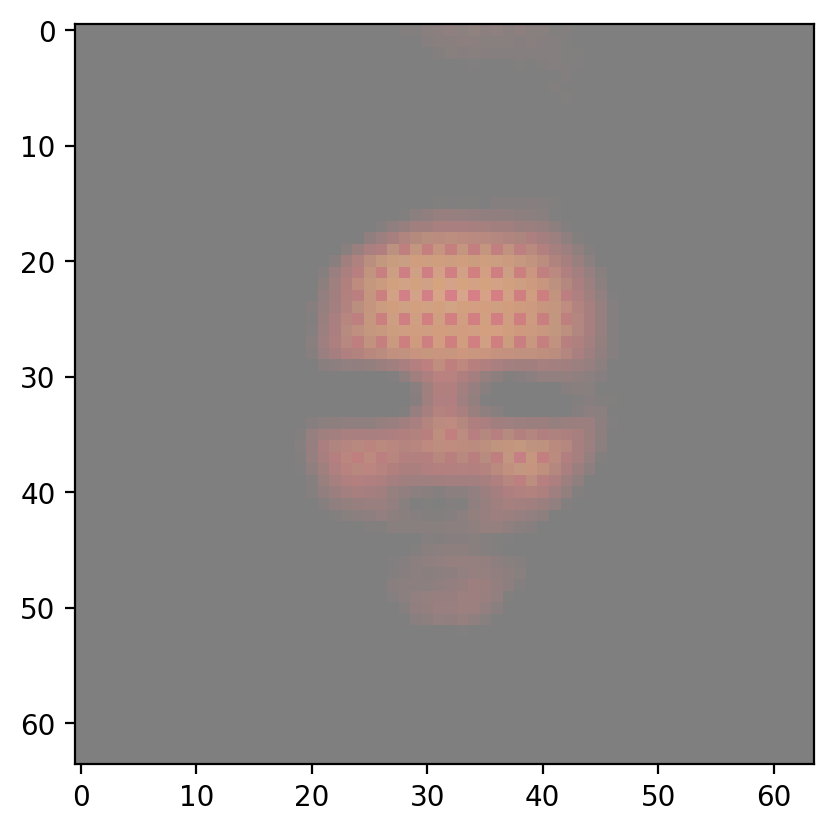

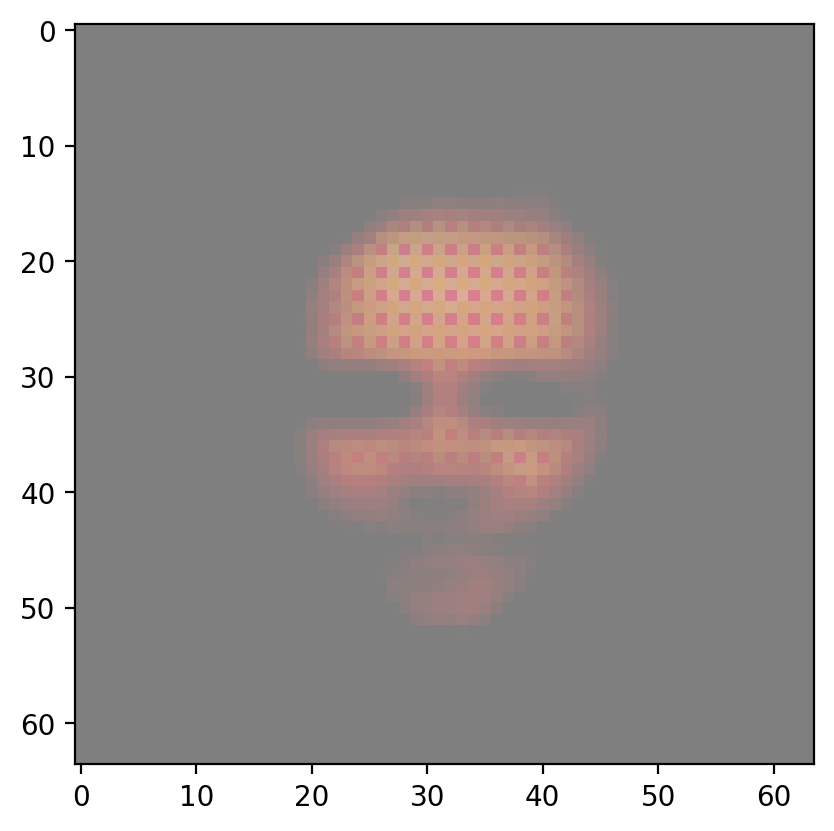

In [ ]:
for im in reconstructed_image:
    imshow(im[0,:,:,:])

>**Exercise:** Using TSNE over `z_batch``, show how real images are projected in a 2D space. The following function is handy (it was already used in the previous lab)

In [ ]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def rescale(img):
    img = img / 2 + 0.5     # unnormalize to pot
    npimg = img.numpy()
    return np.transpose(npimg, (1, 2, 0))

def plot_latent_space_with_images(images,latent,xmin=-150,xmax=150,ymin=-150,ymax=150):

    # images --> Minibatch of images (numpy array!)
    # latent --> Matrix of 2D representations (numpy array!)

    f, ax = plt.subplots(1,1,figsize=(8, 8))
    # ax is a figure handle
    ax.clear()
    for i in range(len(images)):
        im = OffsetImage(rescale(images[i,:,:,:]))
        ab = AnnotationBbox(im, latent[i,:],frameon=False)
        ax.add_artist(ab)
    #We set the limits according to the maximum and minimum values found for the latent projections
    ax.set_xlim(xmin,xmax)
    ax.set_ylim(ymin,ymax)
    ax.set_title('Latent space Z with Images')

In [ ]:
from sklearn.manifold import TSNE

In [ ]:
# Apply TSNE over z_batch
z_batch_cpu = z_batch.detach().cpu().numpy()

# Apply TSNE over z_batch
latent_tsne = TSNE(n_components=2).fit_transform(z_batch_cpu)

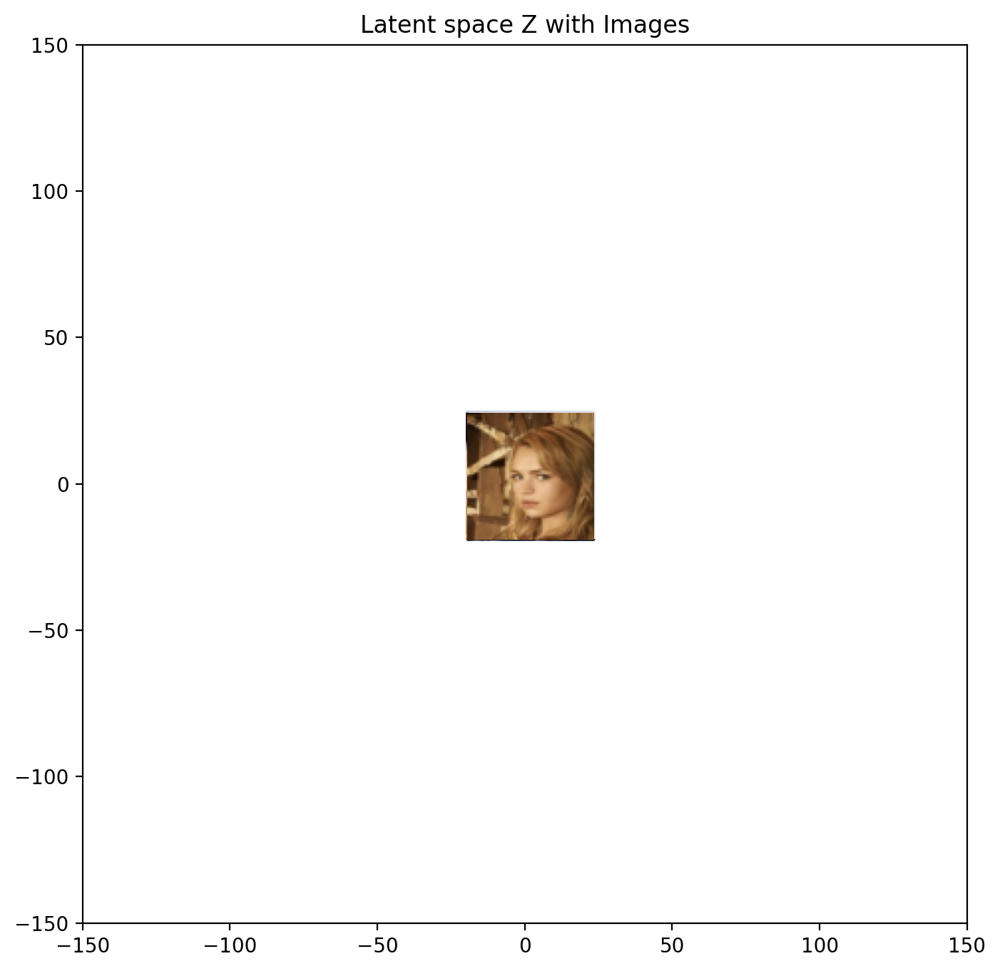

In [ ]:
plot_latent_space_with_images(i, latent_tsne)

## Train the VAE from scratch

Just to finish, train your own VAE from zero for a few epochs and generate images from the model.

In [ ]:
 #YOUR CODE HERE

Train Epoch: 0 	Loss: 526512.301933
Train Epoch: 1 	Loss: 466593.725253
Train Epoch: 2 	Loss: 453696.086525
Train Epoch: 3 	Loss: 439249.628703
Train Epoch: 4 	Loss: 436000.543127
Train Epoch: 5 	Loss: 433212.546243
Train Epoch: 6 	Loss: 430947.561416
Train Epoch: 7 	Loss: 428384.956105
Train Epoch: 8 	Loss: 426368.661714
Train Epoch: 9 	Loss: 424813.040417
Train Epoch: 10 	Loss: 423931.284592
Train Epoch: 11 	Loss: 422353.000993
Train Epoch: 12 	Loss: 421571.592395
Train Epoch: 13 	Loss: 420933.776192
Train Epoch: 14 	Loss: 420332.594834


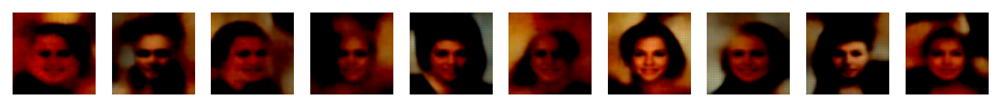

In [ ]:
# Define parameters
dimz = 50
epochs = 15
lr = 1e-3
var_x = 0.1

# Define save folder
path_to_save = '/content/drive/My Drive/datasets/Project IV NL/'

# Initialize VAE model
my_vae = VAE_extended(dimz=dimz, epochs=epochs, var_x=var_x, lr=lr, save_folder=path_to_save)

# Train the model
my_vae.trainloop(trainloader)

# Generate images
num_imgs = 10  # Number of images to generate
generated_images = my_vae.sample(num_imgs)

# Plot the generated images
plt.figure(figsize=(10, 2))
for i in range(num_imgs):
    plt.subplot(1, num_imgs, i+1)
    plt.imshow(generated_images[i].permute(1, 2, 0).cpu().numpy())
    plt.axis('off')
plt.show()

# PART II

We are going to generate data from the 10 components, for 1000 points each, giving a total of 10000 components. Each point consists of three coordinates (it is in three dimensions)

In [ ]:
num_components = 10
num_samples_per_component = 1000

# Define means and covariances for each component
means = np.random.uniform(-5, 5, size=(num_components, 3))
covariances = np.random.uniform(0.1, 1, size=(num_components, 3, 3))
covariances = np.array([np.dot(cov, cov.T) for cov in covariances])  # Ensure positive semi-definite matrices

# Generate data from the GMM
data = []
for i in range(num_components):
    component_data = np.random.multivariate_normal(means[i], covariances[i], num_samples_per_component)
    data.append(component_data)

data = np.concatenate(data, axis=0)
print("Shape of synthetic data:", data.shape)


Shape of synthetic data: (10000, 3)


In [ ]:
covariances

array([[[1.19173195, 0.84143764, 0.83469818],
        [0.84143764, 0.90498911, 0.79790275],
        [0.83469818, 0.79790275, 0.83564233]],

       [[1.36057514, 1.10468609, 1.1998887 ],
        [1.10468609, 1.41818409, 0.81338636],
        [1.1998887 , 0.81338636, 1.10846266]],

       [[1.66496123, 0.99243089, 0.77867123],
        [0.99243089, 0.69461135, 0.45266192],
        [0.77867123, 0.45266192, 0.70500727]],

       [[1.87867373, 1.82475682, 1.16500922],
        [1.82475682, 2.18785146, 1.52069657],
        [1.16500922, 1.52069657, 1.14821172]],

       [[0.66503843, 0.65160161, 0.84095395],
        [0.65160161, 1.4278673 , 1.30001709],
        [0.84095395, 1.30001709, 1.509657  ]],

       [[0.65249435, 0.63710379, 1.01985148],
        [0.63710379, 0.64105516, 0.99223244],
        [1.01985148, 0.99223244, 1.62266887]],

       [[1.25929828, 0.80047824, 0.33405458],
        [0.80047824, 0.96918503, 0.39879126],
        [0.33405458, 0.39879126, 0.16634356]],

       [[1.40951062,

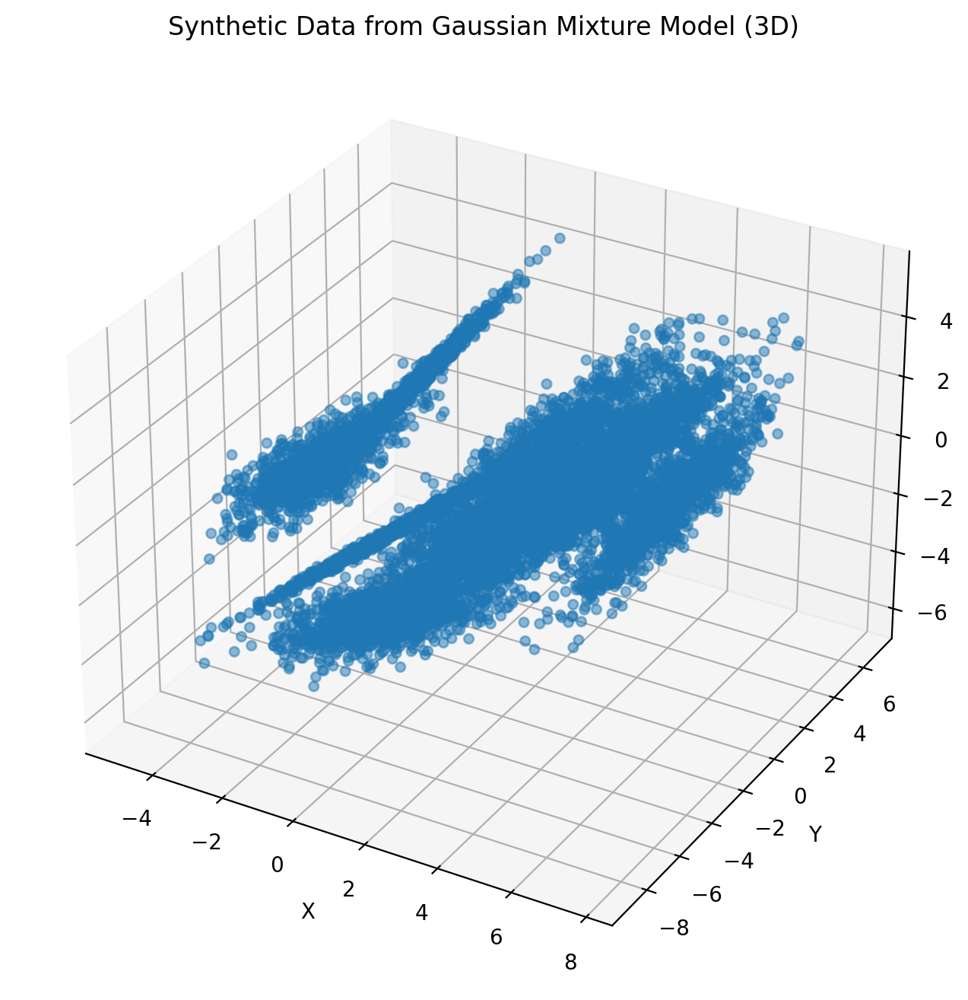

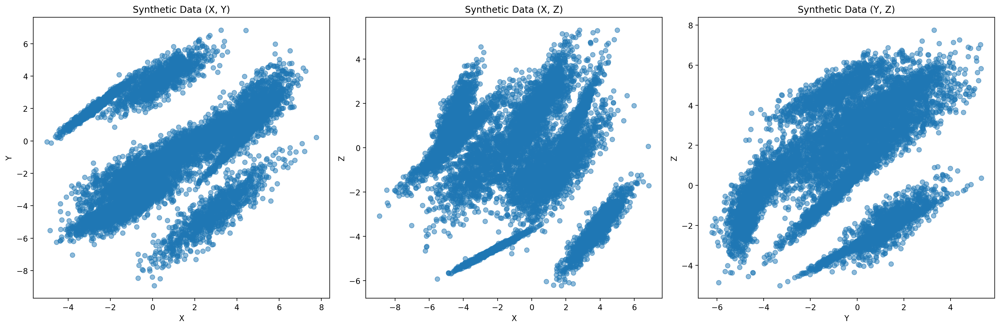

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Plot in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(data[:, 0], data[:, 1], data[:, 2], alpha=0.5)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Synthetic Data from Gaussian Mixture Model (3D)')
plt.show()

# Plot along the three axes (two-dimensionally)
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes_labels = [('X', 'Y'), ('X', 'Z'), ('Y', 'Z')]

for i in range(3):
    axes[i].scatter(data[:, i], data[:, (i + 1) % 3], alpha=0.5)
    axes[i].set_xlabel(axes_labels[i][0])
    axes[i].set_ylabel(axes_labels[i][1])
    axes[i].set_title('Synthetic Data ({}, {})'.format(axes_labels[i][0], axes_labels[i][1]))

plt.tight_layout()
plt.show()

Normalize the data in order to be able to feed it to VAE.

In [ ]:
data_min = np.min(data)
data_max = np.max(data)
data_normalized = (data - data_min) / (data_max - data_min)

# Convert normalized data to torch tensor
data_tensor = torch.tensor(data_normalized, dtype=torch.float32)

## VAE wo/ TRAINING METHOD

In [ ]:
class Encoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(Encoder, self).__init__()
        self.input_dim = input_dim
        self.latent_dim = latent_dim

        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc_mu = nn.Linear(64, latent_dim)
        self.fc_logvar = nn.Linear(64, latent_dim)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar

class Decoder(nn.Module):
    def __init__(self, latent_dim, output_dim):
        super(Decoder, self).__init__()
        self.latent_dim = latent_dim
        self.output_dim = output_dim

        self.fc1 = nn.Linear(latent_dim, 64)
        self.fc2 = nn.Linear(64, 128)
        self.fc3 = nn.Linear(128, output_dim)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, z):
        z = self.relu(self.fc1(z))
        z = self.relu(self.fc2(z))
        x_hat = self.sigmoid(self.fc3(z))
        return x_hat

class VAE(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(VAE, self).__init__()
        self.input_dim = input_dim
        self.latent_dim = latent_dim
        self.encoder = Encoder(input_dim, latent_dim)
        self.decoder = Decoder(latent_dim, input_dim)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encoder(x.view(-1, self.input_dim))
        z = self.reparameterize(mu, logvar)
        x_hat = self.decoder(z)
        return x_hat, mu, logvar

    def loss_function(self, x, x_hat, mu, logvar):
        BCE = nn.functional.binary_cross_entropy(x_hat, x.view(-1, self.input_dim), reduction='sum')
        KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
        return BCE + KLD

# Define hyperparameters
input_dim = 3  # Dimensionality of the input data
latent_dim = 2  # Dimensionality of the latent space
lr = 1e-3  # Learning rate
epochs = 50  # Number of training epochs

# Initialize VAE model
vae = VAE(input_dim, latent_dim)

# Define optimizer
optimizer = optim.Adam(vae.parameters(), lr=lr)

Generate the samples

Epoch [1/50], Loss: 21090.1484
Epoch [2/50], Loss: 20900.7441
Epoch [3/50], Loss: 20783.8652
Epoch [4/50], Loss: 20707.0996
Epoch [5/50], Loss: 20676.9629
Epoch [6/50], Loss: 20658.0312
Epoch [7/50], Loss: 20648.3516
Epoch [8/50], Loss: 20639.4883
Epoch [9/50], Loss: 20633.1875
Epoch [10/50], Loss: 20628.7617
Epoch [11/50], Loss: 20629.6348
Epoch [12/50], Loss: 20632.7695
Epoch [13/50], Loss: 20627.8555
Epoch [14/50], Loss: 20629.2500
Epoch [15/50], Loss: 20629.9922
Epoch [16/50], Loss: 20628.5293
Epoch [17/50], Loss: 20620.4746
Epoch [18/50], Loss: 20615.8613
Epoch [19/50], Loss: 20614.2988
Epoch [20/50], Loss: 20607.1699
Epoch [21/50], Loss: 20601.7949
Epoch [22/50], Loss: 20595.8125
Epoch [23/50], Loss: 20594.9551
Epoch [24/50], Loss: 20593.9258
Epoch [25/50], Loss: 20593.7812
Epoch [26/50], Loss: 20595.0703
Epoch [27/50], Loss: 20595.9629
Epoch [28/50], Loss: 20599.1582
Epoch [29/50], Loss: 20595.7754
Epoch [30/50], Loss: 20594.6406
Epoch [31/50], Loss: 20595.5430
Epoch [32/50], Lo

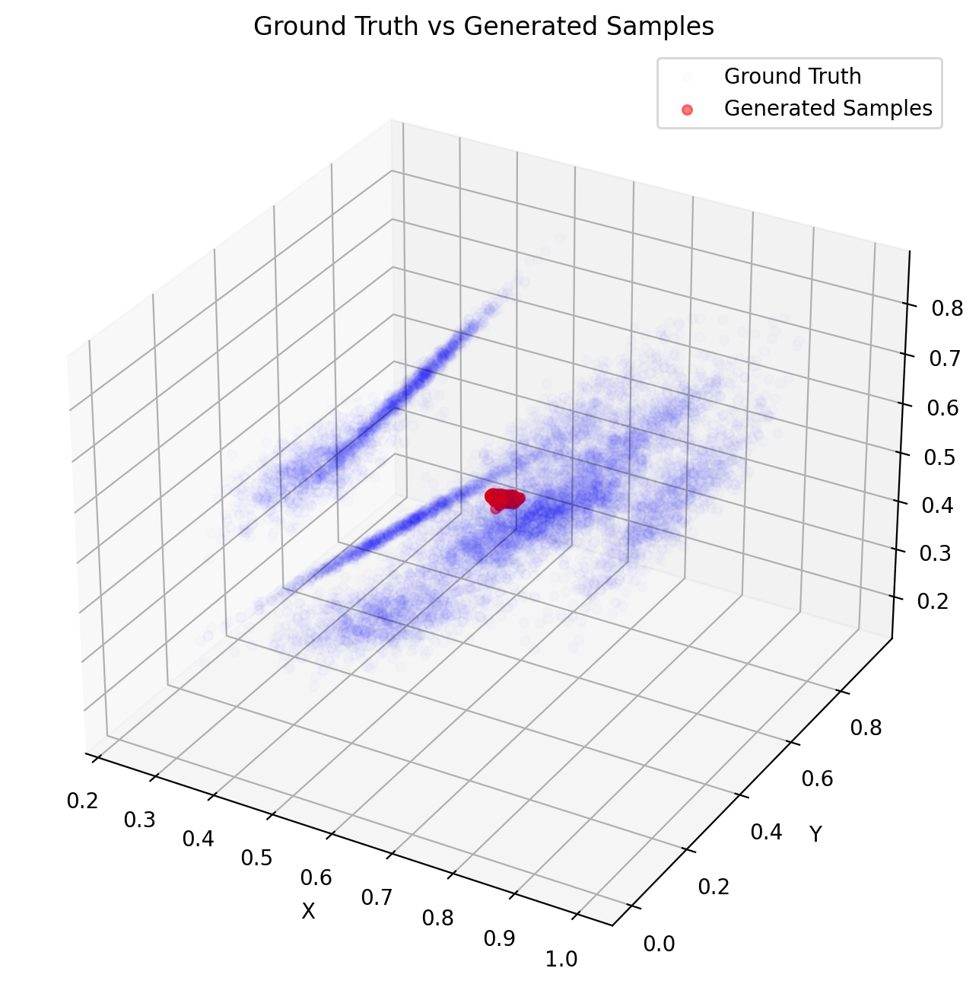

In [ ]:
data_tensor = torch.tensor(data_normalized, dtype=torch.float32)

# Training loop
vae.train()
for epoch in range(epochs):
    optimizer.zero_grad()
    recon_batch, mu, logvar = vae(data_tensor)
    loss = vae.loss_function(data_tensor, recon_batch, mu, logvar)
    loss.backward()
    optimizer.step()
    print('Epoch [{}/{}], Loss: {:.4f}'.format(epoch+1, epochs, loss.item()))

# Set VAE to evaluation mode
vae.eval()

# Generate samples from the learned latent space
with torch.no_grad():
    latent_samples = torch.randn(1000, latent_dim)
    generated_samples = vae.decoder(latent_samples).numpy()

# Plot the generated samples
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(data_normalized[:, 0], data_normalized[:, 1], data_normalized[:, 2], label='Ground Truth', c='b', alpha=0.01)
ax.scatter(generated_samples[:, 0], generated_samples[:, 1], generated_samples[:, 2], label='Generated Samples', c='r', alpha=0.5)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.legend()
plt.title('Ground Truth vs Generated Samples')
plt.show()

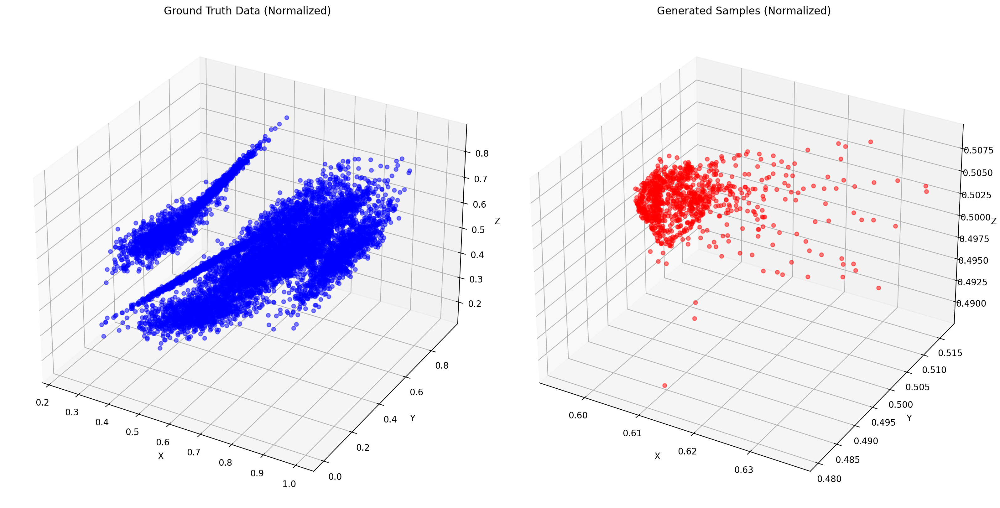

In [ ]:
fig = plt.figure(figsize=(16, 8))

# Plot ground truth data (normalized)
ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(data_normalized[:, 0], data_normalized[:, 1], data_normalized[:, 2], label='Ground Truth (Normalized)', c='b', alpha=0.5)
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_zlabel('Z')
ax1.set_title('Ground Truth Data (Normalized)')

# Plot generated samples (normalized)
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(generated_samples[:, 0], generated_samples[:, 1], generated_samples[:, 2], label='Generated Samples (Normalized)', c='r', alpha=0.5)
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_zlabel('Z')
ax2.set_title('Generated Samples (Normalized)')

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import cdist

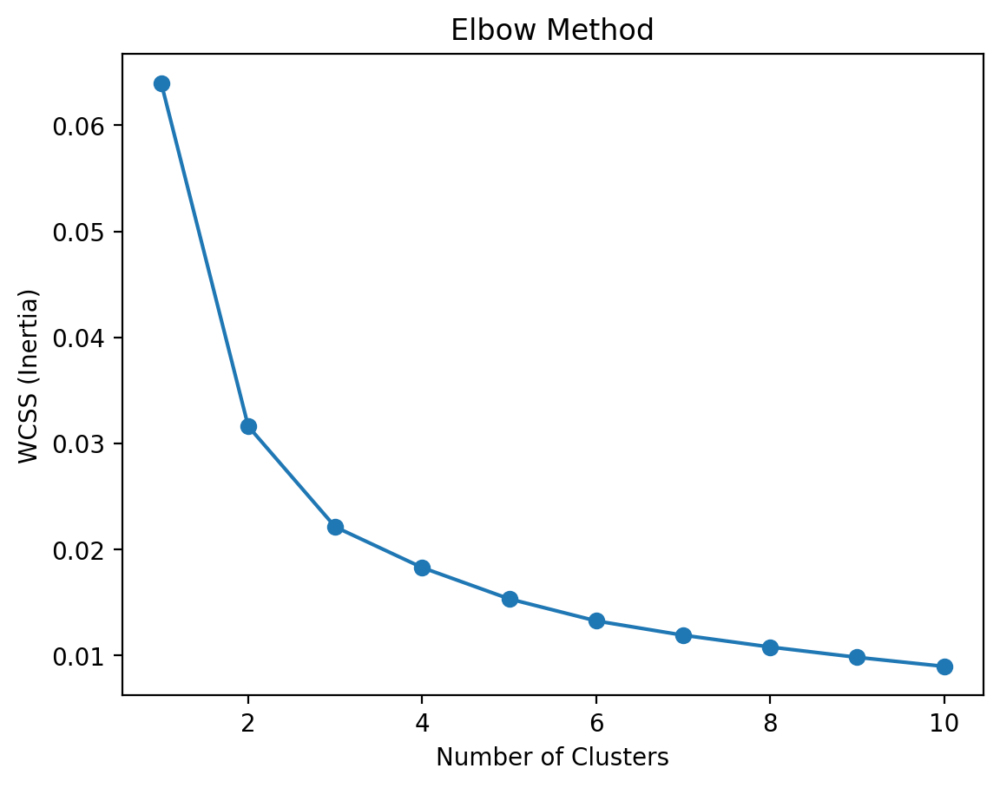

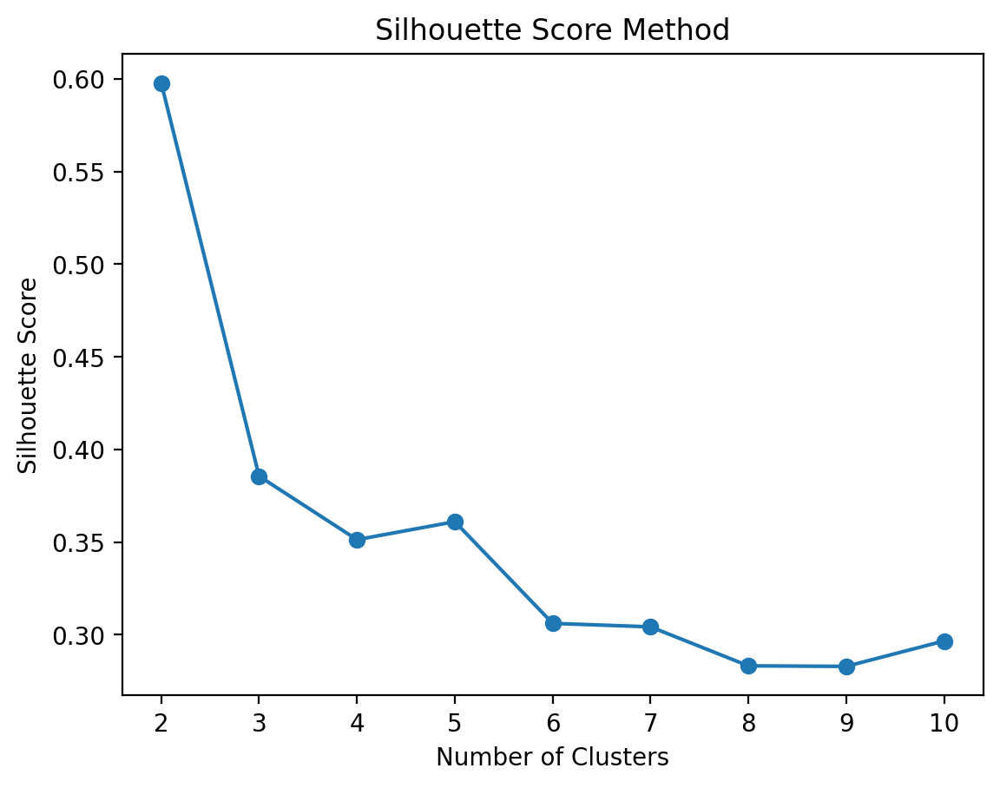

In [ ]:
inertia_values = []
silhouette_scores = []

# Define the range of clusters to try
max_clusters = 10  # Maximum number of clusters to try
for k in range(1, max_clusters + 1):
    kmeans = KMeans(n_clusters=k, random_state=0, n_init = 10)
    kmeans.fit(generated_samples)
    inertia_values.append(kmeans.inertia_)
    if k >= 2:
      cluster_labels = kmeans.fit_predict(generated_samples)
      silhouette_scores.append(silhouette_score(generated_samples, cluster_labels))


# Plot the elbow curve
plt.plot(range(1, max_clusters + 1), inertia_values, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS (Inertia)')
plt.title('Elbow Method')
plt.show()

# Plot silhouette scores
plt.plot(range(2, max_clusters + 1), silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score Method')
plt.show()

In [ ]:
silhouette_scores

[0.5976997,
 0.38555443,
 0.35129926,
 0.3610073,
 0.30611646,
 0.30425304,
 0.28319687,
 0.2829068,
 0.29663348]

In [ ]:
kmeans_ground_truth = KMeans(n_clusters=num_components, random_state=0, n_init = 10).fit(data_normalized)
kmeans_generated = KMeans(n_clusters=1, random_state=0, n_init = 10).fit(generated_samples)

In [ ]:
cluster_centers_ground_truth = kmeans_ground_truth.cluster_centers_
cluster_centers_generated = kmeans_generated.cluster_centers_

# Compute pairwise distances between cluster centers
distances = cdist(cluster_centers_ground_truth, cluster_centers_generated)

# Find the closest cluster for each ground truth cluster

print("Closest clusters for each ground truth cluster:", distances)

Closest clusters for each ground truth cluster: [[0.32153133]
 [0.0261143 ]
 [0.34119613]
 [0.28781183]
 [0.23713354]
 [0.2324832 ]
 [0.26147391]
 [0.32529186]
 [0.30377816]
 [0.18969286]]


In [ ]:
dist = 1
k = 0
for i, dist_ in enumerate(distances):
  if dist_ < dist:
    k = i
    dist = dist_

In [ ]:
k

1

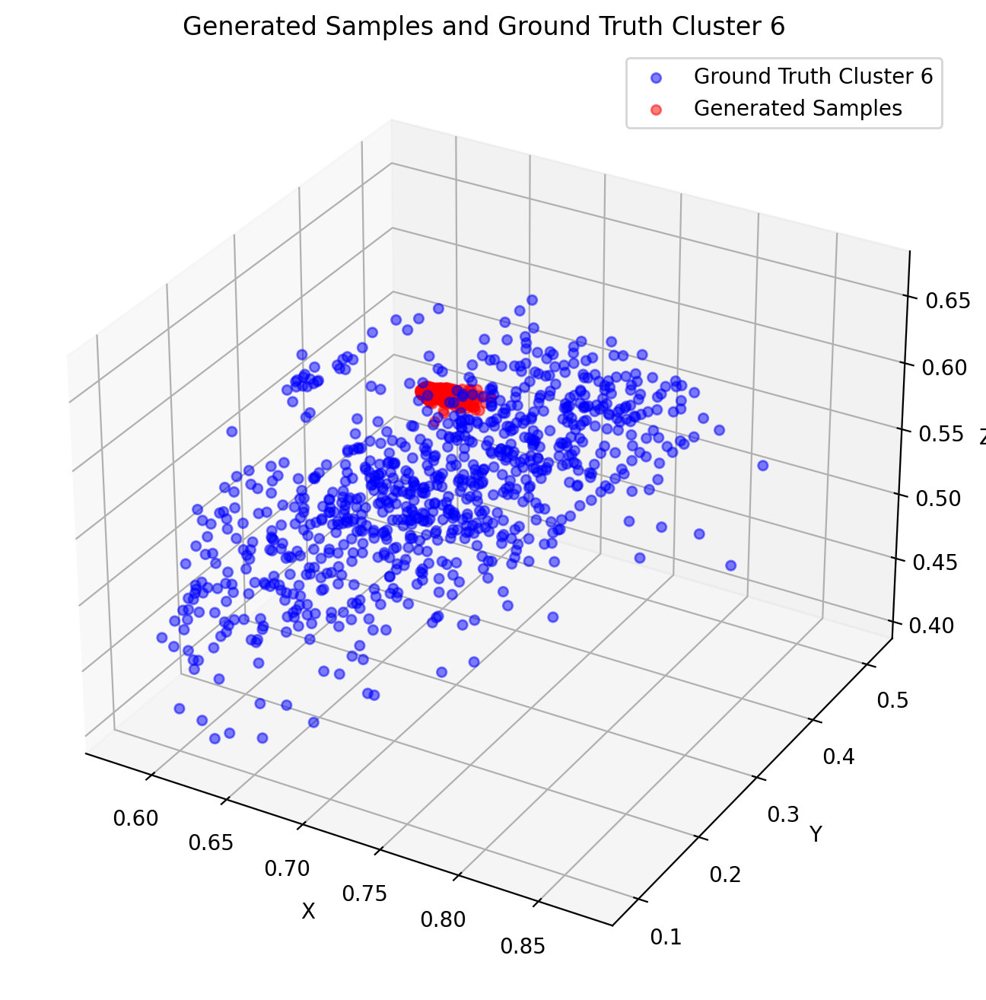

In [ ]:
data_cluster = data_normalized[kmeans_ground_truth.labels_ == 6]

# Plot the clusters
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot ground truth data with cluster label 6
ax.scatter(data_cluster[:, 0], data_cluster[:, 1], data_cluster[:, 2], label='Ground Truth Cluster 6', c='b', alpha=0.5)

# Plot generated samples
ax.scatter(generated_samples[:, 0], generated_samples[:, 1], generated_samples[:, 2], label='Generated Samples', c='r', alpha=0.5)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.legend()
plt.title('Generated Samples and Ground Truth Cluster 6')
plt.show()

Define the VAE architecture

In [ ]:
class Encoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(Encoder, self).__init__()
        self.input_dim = input_dim
        self.latent_dim = latent_dim

        # Define encoder layers
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc_mu = nn.Linear(64, latent_dim)
        self.fc_logvar = nn.Linear(64, latent_dim)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar

class Decoder(nn.Module):
    def __init__(self, latent_dim, output_dim):
        super(Decoder, self).__init__()
        self.latent_dim = latent_dim
        self.output_dim = output_dim

        # Define decoder layers
        self.fc1 = nn.Linear(latent_dim, 64)
        self.fc2 = nn.Linear(64, 128)
        self.fc3 = nn.Linear(128, output_dim)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, z):
        z = self.relu(self.fc1(z))
        z = self.relu(self.fc2(z))
        x_hat = self.sigmoid(self.fc3(z))
        return x_hat

class VAE(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(VAE, self).__init__()
        self.input_dim = input_dim
        self.latent_dim = latent_dim
        self.encoder = Encoder(input_dim, latent_dim)
        self.decoder = Decoder(latent_dim, input_dim)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar = self.encoder(x.view(-1, self.input_dim))
        z = self.reparameterize(mu, logvar)
        x_hat = self.decoder(z)
        return x_hat, mu, logvar

    def loss_function(self, x, x_hat, mu, logvar):
        BCE = nn.functional.binary_cross_entropy(x_hat, x.view(-1, self.input_dim), reduction='sum')
        KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
        return BCE + KLD

# Define hyperparameters
input_dim = 3        # Dimensionality of the input data
latent_dim = 3       # Dimensionality of the latent space
lr = 1e-3            # Learning rate
batch_size = 64      # Batch size
num_epochs = 15      # Number of training epochs

In [ ]:
# Split the data into training, validation, and testing sets
train_split = int(0.8 * data.shape[0])
val_split = int(0.1 * data.shape[0])
train_data = data_normalized[:train_split]
val_data = data_normalized[train_split:train_split + val_split]
test_data = data_normalized[train_split + val_split:]

# Create DataLoader objects for training and validation sets
train_loader = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(torch.tensor(train_data, dtype=torch.float32)), batch_size=batch_size, shuffle=True)
val_loader = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(torch.tensor(val_data, dtype=torch.float32)), batch_size=batch_size)

# Initialize VAE model
vae = VAE(input_dim, latent_dim)

# Define optimizer
optimizer = optim.Adam(vae.parameters(), lr=lr)

# Training loop
for epoch in range(num_epochs):
    # Training phase
    vae.train()
    for batch in train_loader:
        optimizer.zero_grad()
        data_batch = batch[0]
        recon_batch, mu, logvar = vae(data_batch)
        loss = vae.loss_function(data_batch, recon_batch, mu, logvar)
        loss.backward()
        optimizer.step()

    # Validation phase
    vae.eval()
    val_loss = 0
    with torch.no_grad():
        for batch in val_loader:
            data_batch = batch[0]
            recon_batch, mu, logvar = vae(data_batch)
            val_loss += vae.loss_function(data_batch, recon_batch, mu, logvar).item()

    # Print or log training and validation metrics
    print(f"Epoch [{epoch + 1}/{num_epochs}], Training Loss: {loss.item():.4f}, Validation Loss: {val_loss / len(val_loader):.4f}")

# Evaluate the model on the testing set
test_loader = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(torch.tensor(test_data, dtype=torch.float32)), batch_size=batch_size)
vae.eval()
test_loss = 0
with torch.no_grad():
    for batch in test_loader:
        data_batch = batch[0]
        recon_batch, mu, logvar = vae(data_batch)
        test_loss += vae.loss_function(data_batch, recon_batch, mu, logvar).item()

# Report final testing loss
print(f"Final Testing Loss: {test_loss / len(test_loader):.4f}")

Epoch [1/15], Training Loss: 132.2355, Validation Loss: 124.0439
Epoch [2/15], Training Loss: 131.1673, Validation Loss: 124.2346
Epoch [3/15], Training Loss: 131.4895, Validation Loss: 124.5421
Epoch [4/15], Training Loss: 131.5900, Validation Loss: 124.6920
Epoch [5/15], Training Loss: 131.6494, Validation Loss: 124.7844
Epoch [6/15], Training Loss: 131.0171, Validation Loss: 124.6073
Epoch [7/15], Training Loss: 130.9570, Validation Loss: 123.9783
Epoch [8/15], Training Loss: 132.2496, Validation Loss: 124.6611
Epoch [9/15], Training Loss: 131.6497, Validation Loss: 124.2593
Epoch [10/15], Training Loss: 132.0886, Validation Loss: 124.4374
Epoch [11/15], Training Loss: 131.8179, Validation Loss: 124.6766
Epoch [12/15], Training Loss: 131.7515, Validation Loss: 124.5653
Epoch [13/15], Training Loss: 132.0527, Validation Loss: 124.8193
Epoch [14/15], Training Loss: 131.6043, Validation Loss: 124.7089
Epoch [15/15], Training Loss: 131.6052, Validation Loss: 125.0459
Final Testing Loss:

In [ ]:
# Generate samples from the learned latent space
with torch.no_grad():
    latent_samples = torch.randn(10000, latent_dim)
    generated_samples = vae.decoder(latent_samples).numpy()

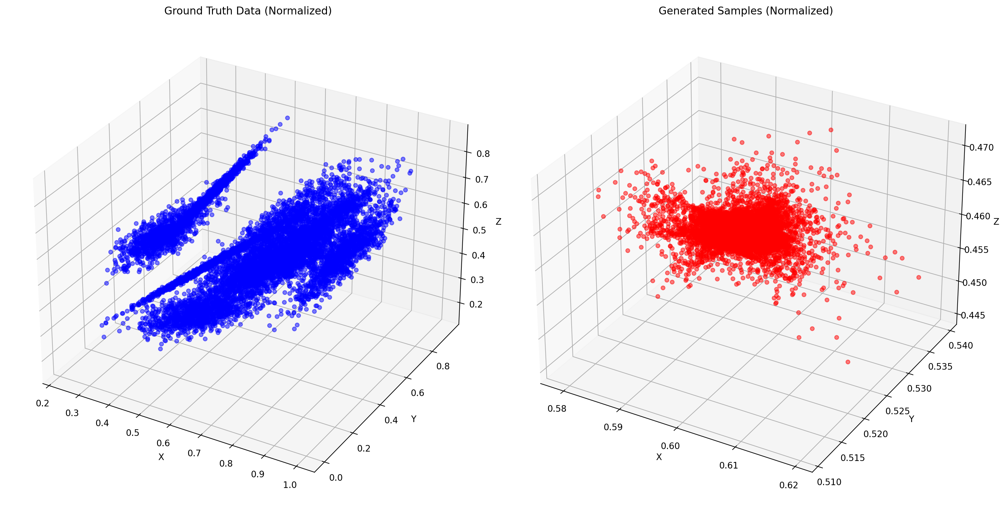

In [ ]:
fig = plt.figure(figsize=(16, 8))

# Plot ground truth data (normalized)
ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(data_normalized[:, 0], data_normalized[:, 1], data_normalized[:, 2], label='Ground Truth (Normalized)', c='b', alpha=0.5)
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_zlabel('Z')
ax1.set_title('Ground Truth Data (Normalized)')

# Plot generated samples (normalized)
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(generated_samples[:, 0], generated_samples[:, 1], generated_samples[:, 2], label='Generated Samples (Normalized)', c='r', alpha=0.5)
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_zlabel('Z')
ax2.set_title('Generated Samples (Normalized)')

plt.tight_layout()
plt.show()

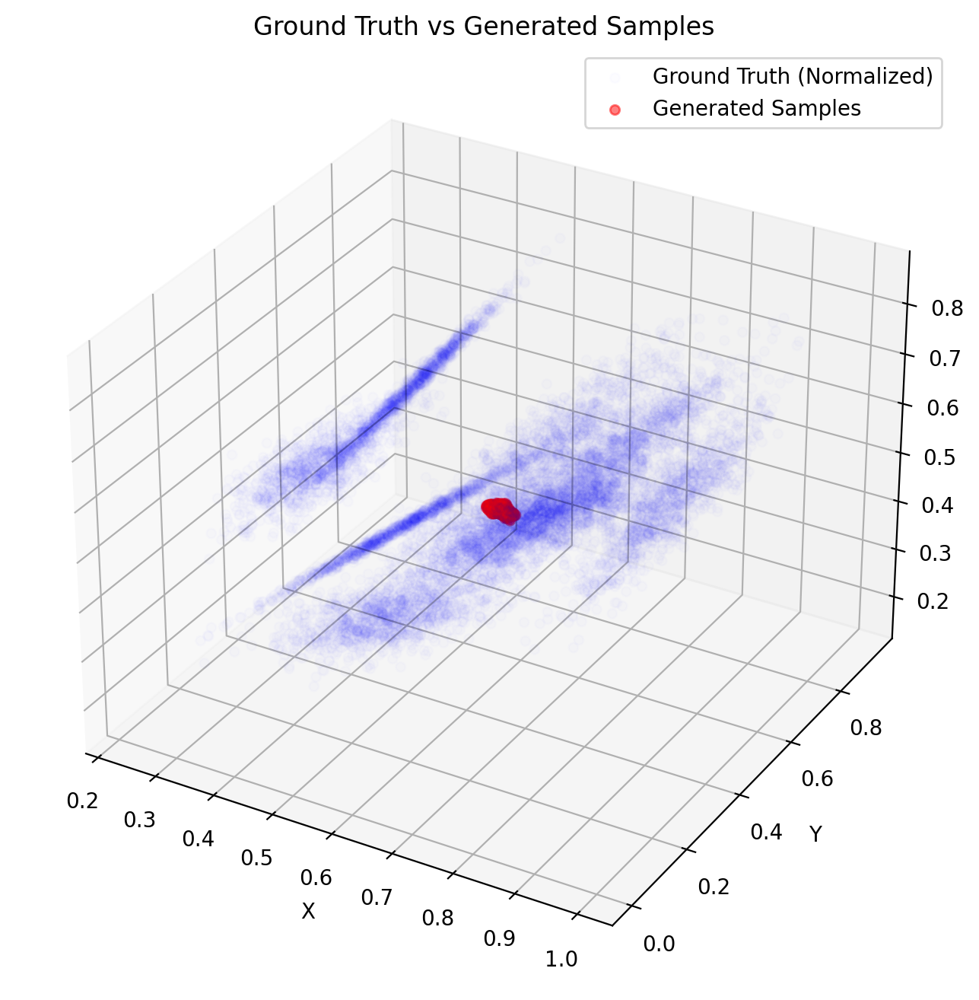

In [ ]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot ground truth data (normalized)
ax.scatter(data_normalized[:, 0], data_normalized[:, 1], data_normalized[:, 2], label='Ground Truth (Normalized)', c='b', alpha=0.01)

# Plot generated samples
ax.scatter(generated_samples[:, 0], generated_samples[:, 1], generated_samples[:, 2], label='Generated Samples', c='r', alpha=0.5)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.legend()
plt.title('Ground Truth vs Generated Samples')
plt.show()

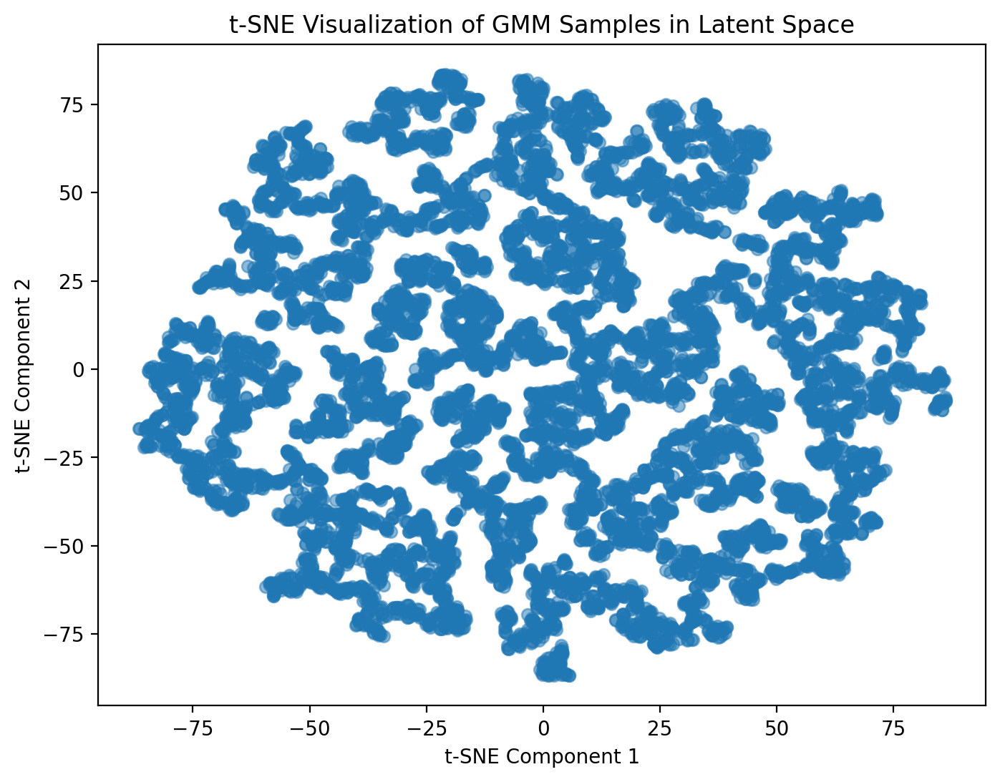

In [ ]:
tsne = TSNE(n_components=2, random_state=42)
latent_tsne = tsne.fit_transform(latent_samples)

# Plot t-SNE visualization
plt.figure(figsize=(8, 6))
plt.scatter(latent_tsne[:, 0], latent_tsne[:, 1], alpha=0.5)
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('t-SNE Visualization of GMM Samples in Latent Space')
plt.show()